## Gradient boosted decision tree regressor analysis 

- **Purpose**: The purpose of this notebook is to test the performance of XGBRegressor 
- **Author**: Crystal Geng 

- **Data**:
    - Uniformly sampled data where the same number of data was sampled in each track momentum bin, with bin size = 1 GeV/C 
    - Only muons are included 
- **Model type**: 
    - Regressor 
- **Engineered features**
    - `x_realigned_min`: minimum hit position realigned by subtracting track position x in each event
    - `x_realigned_max`: maximum hit position realigned by subtracting track position x in each event
    - `y_realigned_min`: minimum hit position realigned by subtracting track position y in each event
    - `y_realigned_max`: maximum hit position realigned by subtracting track position y in each event
    - `min_hit_radius`: minimum distance between hit position and track position in each event 
    - `max_hit_radius`: maximum distance between hit position and track position in each event 
    - `mean_hit_radius`: mean distance between hit position and track position in each event 
    - `median_hit_radius`: median distance between hit position and track position in each event 
    - `rms_hit_radius`: root mean squared distance between hit position and track position in each event 
    - `x_min_sum`: the x-coordinate of the point that has the minimum (x+y) in each event 
    - `y_min_sum`: the y-coordinate of the point that has the minimum (x+y) in each event 
    - `x_max_sum`: the x-coordinate of the point that has the maximum (x+y) in each event 
    - `y_max_sum`: the y-coordinate of the point that has the maximum (x+y) in each event 
    - `x_min_diff`: the x-coordinate of the point that has the minimum (x-y) in each event 
    - `y_min_diff`: the y-coordinate of the point that has the minimum (x-y) in each event
    - `x_max_diff`: the x-coordinate of the point that has the maximum (x-y) in each event 
    - `y_max_diff`: the y-coordinate of the point that has the maximum (x-y) in each event 
    - `max_x-min_x`: maximum hit position x minus minimum hit position x in each event
    - `max_y-min_y`: maximum hit position y minus minimum hit position y in each event 
- **Preprocessing**:
    - Only the in-time hits where delta <= 0.5 are included 
    - Events with ring centred position greater than 1000 are excluded 
- **Training**:
    - XGBRegressor for training with default values 

In [23]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
import sys
import glob
import warnings
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import seaborn as sns

## 1. Read the data

#### Read the concatenated hits and events data 

In [24]:
hit_data_uniform = pd.read_csv("../../data/hit_data_uniform.csv")

#### Read the uniformly sampled events data (for retrieving the radius)

In [25]:
sampled_data = pd.read_csv('../data/sampled_data.csv')

In [26]:
sampled_data_track = sampled_data[['track_pos_x', 'track_pos_y']]

In [27]:
hit_data_uniform = hit_data_uniform.drop(hit_data_uniform.columns[0], axis=1)

#### Filter out the out-of-time hits

In [28]:
hit_data_df_intime = hit_data_uniform.query('abs(chod_delta) <= 0.5')

In [29]:
hit_data_df_intime = hit_data_df_intime.query('abs(x_realigned) <= 1000 & abs(y_realigned) <= 1000')

In [30]:
hit_data_df_intime = hit_data_df_intime.drop(columns=['ring_radius', 'hit_time', 'chod_time', 'chod_delta', 'mirror'])

In [31]:
hit_data_df_intime = hit_data_df_intime.merge(sampled_data_track, left_on='event', right_index=True)

In [32]:
hit_data_df_intime['x_hit_pos'] = hit_data_df_intime['x_realigned'] - hit_data_df_intime['track_pos_x']

In [33]:
hit_data_df_intime['y_hit_pos'] = hit_data_df_intime['y_realigned'] - hit_data_df_intime['track_pos_y']

In [34]:
hit_data_df_intime = hit_data_df_intime.drop(columns=['x_realigned', 'y_realigned'])

In [35]:
hit_data_df_intime = hit_data_df_intime.rename(columns={'x_hit_pos': 'x_realigned', 'y_hit_pos': 'y_realigned'})

## 2. Feature engineering

#### Compute the distance between each hit point and the track position

In [36]:
hit_data_df_intime["distance"] = (
    (hit_data_df_intime["x_realigned"]) ** 2 +
    (hit_data_df_intime["y_realigned"]) ** 2
) ** 0.5

hit_data_df_intime

,x,y,class,event,momentum,ring_radius_calc,ring_centre_pos_x,ring_centre_pos_y,track_pos_x,track_pos_y,x_realigned,y_realigned,distance
10,90.0,-265.00,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,135.98484,-114.353820,177.675752
11,99.0,-62.35,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,144.98484,88.296182,169.755175
12,90.0,-46.77,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,135.98484,103.876180,171.120242
13,99.0,-249.42,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,144.98484,-98.773818,175.433380
14,126.0,-171.47,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,171.98484,-20.823821,173.240921
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32858050,243.0,-31.18,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,142.48376,-126.207040,190.341375
32858051,9.0,249.42,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,-91.51624,154.392958,179.478154
32858052,-45.0,218.24,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,-145.51624,123.212965,190.673572
32858053,-99.0,187.06,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,-199.51624,92.032958,219.719811


#### Compute `x+y` and `x-y` columns 

In [37]:
hit_data_df_intime['x+y'] = hit_data_df_intime['x_realigned'] + hit_data_df_intime['y_realigned']
hit_data_df_intime['x-y'] = hit_data_df_intime['x_realigned'] - hit_data_df_intime['y_realigned']

#### Compute `max_x`, `min_x`, `max_y`, `min_y`, `index_min(x+y)`, `index_max(x+y)`, `index_min(x-y)`, `index_max(x-y)`, `min_hit_radius`, `max_hit_radius`, `mean_hit_radius`, `median_hit_radius`, `rms_hit_radius`

In [38]:
hit_data_df_intime = hit_data_df_intime.reset_index()

In [39]:
rms = lambda x: np.sqrt(np.mean(x**2))

In [22]:
grouped_hit_data = hit_data_df_intime.groupby('event').aggregate(
    {'x_realigned':['min', 'max'], 
    'y_realigned':['min','max'],
    'x+y': ['idxmin', 'idxmax'],
    'x-y': ['idxmin', 'idxmax'],
    'distance': ['min', 'max', 'mean', 'median', rms]})
grouped_hit_data.columns = ['x_realigned_min', 'x_realigned_max', 'y_realigned_min', 'y_realigned_max', 'index_min(x+y)', 'index_max(x+y)', 'index_min(x-y)', 'index_max(x-y)', 'min_hit_radius', 'max_hit_radius', 'mean_hit_radius', 'median_hit_radius', 'rms_hit_radius']
grouped_hit_data= grouped_hit_data.reset_index()
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,index_min(x+y),index_max(x+y),index_min(x-y),index_max(x-y),min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius
0,0,-179.015160,171.984840,-129.943816,103.876180,8,2,5,11,151.900508,194.694631,170.851407,170.437709,171.237843
1,1,-212.939910,165.060090,-204.650600,60.359402,24,15,19,23,161.596201,213.247886,179.537322,175.114729,180.286470
2,2,-180.254796,143.745204,-143.257460,137.342542,36,26,32,27,133.992537,212.257270,171.516891,169.793969,172.413786
3,3,-162.624585,170.375415,-135.996480,113.423522,49,47,48,46,141.991852,191.185237,168.369095,170.420793,168.917960
4,4,-190.995300,169.004700,-178.311630,102.278370,63,55,54,56,146.421301,219.494497,174.830233,171.151574,175.569623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785876,785920,-214.900910,190.099090,-212.278745,161.841250,13399698,13399686,13399705,13399695,167.610159,218.741298,184.738793,182.376908,185.060892
785877,785921,-168.463683,65.536317,-224.188888,181.111115,13399718,13399707,13399722,13399719,181.770079,226.672617,194.517878,188.713267,195.082472
785878,785922,-220.147140,166.852860,-184.695617,189.424393,13399739,13399724,13399742,13399730,166.939652,220.159836,189.836339,188.962224,190.176740
785879,785923,-203.793726,147.206274,-176.365104,182.164895,13399759,13399750,13399744,13399756,149.350901,232.386251,186.414327,184.744325,187.132778


#### Compute `x_min_sum`, `y_min_sum`, `x_max_sum`, `y_max_sum`, `x_min_diff`, `y_min_diff`, `x_max_diff`, `y_max_diff`

In [40]:
grouped_hit_data['x_min_sum'] = grouped_hit_data['index_min(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_min_sum'] = grouped_hit_data['index_min(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_max_sum'] = grouped_hit_data['index_max(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_max_sum'] = grouped_hit_data['index_max(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_min_diff'] = grouped_hit_data['index_min(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_min_diff'] = grouped_hit_data['index_min(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_max_diff'] = grouped_hit_data['index_max(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_max_diff'] = grouped_hit_data['index_max(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])


In [41]:
grouped_hit_data = grouped_hit_data.drop(columns=['index_min(x+y)', 'index_max(x+y)', 'index_min(x-y)', 'index_max(x-y)'])

#### Compute `max_x-min_x` and `max_y-min_y`

In [42]:
grouped_hit_data['max_x-min_x'] = grouped_hit_data['x_realigned_max']-grouped_hit_data['x_realigned_min']
grouped_hit_data['max_y-min_y'] = grouped_hit_data['y_realigned_max']-grouped_hit_data['y_realigned_min']

In [43]:
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,x_min_sum,y_min_sum,x_max_sum,y_max_sum,x_min_diff,y_min_diff,x_max_diff,y_max_diff,max_x-min_x,max_y-min_y
0,0,-179.015160,171.984840,-129.943816,103.876180,151.900508,194.694631,170.851407,170.437709,171.237843,-179.015160,-67.593825,135.984840,103.876180,-143.015160,88.296182,144.984840,-129.943816,351.0,233.819996
1,1,-212.939910,165.060090,-204.650600,60.359402,161.596201,213.247886,179.537322,175.114729,180.286470,-59.939910,-204.650600,165.060090,-64.350597,-158.939910,60.359402,156.060090,-79.940601,378.0,265.010002
2,2,-180.254796,143.745204,-143.257460,137.342542,133.992537,212.257270,171.516891,169.793969,172.413786,-180.254796,-112.077460,134.745204,90.572538,-135.254796,121.752545,116.745204,-127.667460,324.0,280.600002
3,3,-162.624585,170.375415,-135.996480,113.423522,141.991852,191.185237,168.369095,170.420793,168.917960,-162.624585,66.653518,125.375415,66.653518,-153.624585,113.423522,134.375415,-135.996480,333.0,249.420002
4,4,-190.995300,169.004700,-178.311630,102.278370,146.421301,219.494497,174.830233,171.151574,175.569623,-127.995300,-178.311630,169.004700,-6.841625,-127.995300,102.278370,151.004700,-100.371632,360.0,280.590000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785876,785920,-214.900910,190.099090,-212.278745,161.841250,167.610159,218.741298,184.738793,182.376908,185.060892,-214.900910,-40.808751,100.099090,161.841250,-133.900910,130.671252,136.099090,-118.748754,405.0,374.119995
785877,785921,-168.463683,65.536317,-224.188888,181.111115,181.770079,226.672617,194.517878,188.713267,195.082472,-159.463683,-130.658889,-15.463683,181.111115,-105.463683,149.931108,65.536317,-208.598891,234.0,405.300003
785878,785922,-220.147140,166.852860,-184.695617,189.424393,166.939652,220.159836,189.836339,188.962224,190.176740,-112.147140,-184.695617,139.852860,127.074387,-148.147140,127.074387,139.852860,-122.335617,387.0,374.120010
785879,785923,-203.793726,147.206274,-176.365104,182.164895,149.350901,232.386251,186.414327,184.744325,187.132778,-167.793726,-160.775108,93.206274,166.584893,-149.793726,119.814889,57.206274,-176.365104,351.0,358.529999


In [44]:
bins = np.arange(168, 188, 1)
sampled_data['radius_bin'] = pd.cut(sampled_data['ring_radius_cal'], bins=bins)

In [45]:
sampled_data_slice = sampled_data[['track_momentum', 'ring_radius_cal', 'momentum_bin', 'radius_bin']]
sampled_data_slice

,track_momentum,ring_radius_cal,momentum_bin,radius_bin
0,20.456100,169.115423,"(20, 21]","(169, 170]"
1,20.563030,169.337429,"(20, 21]","(169, 170]"
2,20.993650,170.295798,"(20, 21]","(170, 171]"
3,20.068357,168.202808,"(20, 21]","(168, 169]"
4,20.880802,170.035186,"(20, 21]","(170, 171]"
...,...,...,...,...
785920,44.834846,186.287038,"(44, 45]","(186, 187]"
785921,44.213005,186.182741,"(44, 45]","(186, 187]"
785922,44.008110,186.128281,"(44, 45]","(186, 187]"
785923,44.981186,186.319897,"(44, 45]","(186, 187]"


In [46]:
grouped_hit_data = grouped_hit_data.merge(sampled_data_slice, left_on='event', right_index=True)

#### The dataframe that contains all the engineered features 

In [47]:
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,...,x_min_diff,y_min_diff,x_max_diff,y_max_diff,max_x-min_x,max_y-min_y,track_momentum,ring_radius_cal,momentum_bin,radius_bin
0,0,-179.015160,171.984840,-129.943816,103.876180,151.900508,194.694631,170.851407,170.437709,171.237843,...,-143.015160,88.296182,144.984840,-129.943816,351.0,233.819996,20.456100,169.115423,"(20, 21]","(169, 170]"
1,1,-212.939910,165.060090,-204.650600,60.359402,161.596201,213.247886,179.537322,175.114729,180.286470,...,-158.939910,60.359402,156.060090,-79.940601,378.0,265.010002,20.563030,169.337429,"(20, 21]","(169, 170]"
2,2,-180.254796,143.745204,-143.257460,137.342542,133.992537,212.257270,171.516891,169.793969,172.413786,...,-135.254796,121.752545,116.745204,-127.667460,324.0,280.600002,20.993650,170.295798,"(20, 21]","(170, 171]"
3,3,-162.624585,170.375415,-135.996480,113.423522,141.991852,191.185237,168.369095,170.420793,168.917960,...,-153.624585,113.423522,134.375415,-135.996480,333.0,249.420002,20.068357,168.202808,"(20, 21]","(168, 169]"
4,4,-190.995300,169.004700,-178.311630,102.278370,146.421301,219.494497,174.830233,171.151574,175.569623,...,-127.995300,102.278370,151.004700,-100.371632,360.0,280.590000,20.880802,170.035186,"(20, 21]","(170, 171]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785876,785920,-214.900910,190.099090,-212.278745,161.841250,167.610159,218.741298,184.738793,182.376908,185.060892,...,-133.900910,130.671252,136.099090,-118.748754,405.0,374.119995,44.834846,186.287038,"(44, 45]","(186, 187]"
785877,785921,-168.463683,65.536317,-224.188888,181.111115,181.770079,226.672617,194.517878,188.713267,195.082472,...,-105.463683,149.931108,65.536317,-208.598891,234.0,405.300003,44.213005,186.182741,"(44, 45]","(186, 187]"
785878,785922,-220.147140,166.852860,-184.695617,189.424393,166.939652,220.159836,189.836339,188.962224,190.176740,...,-148.147140,127.074387,139.852860,-122.335617,387.0,374.120010,44.008110,186.128281,"(44, 45]","(186, 187]"
785879,785923,-203.793726,147.206274,-176.365104,182.164895,149.350901,232.386251,186.414327,184.744325,187.132778,...,-149.793726,119.814889,57.206274,-176.365104,351.0,358.529999,44.981186,186.319897,"(44, 45]","(186, 187]"


## 3. Plots of features 
#### 3.1 Boxplots of each feature vs. momentum bins 
- The momentum ranges from 20-45 GeV/c is broken down into 25 bins, with each bin size being 1 GeV/c

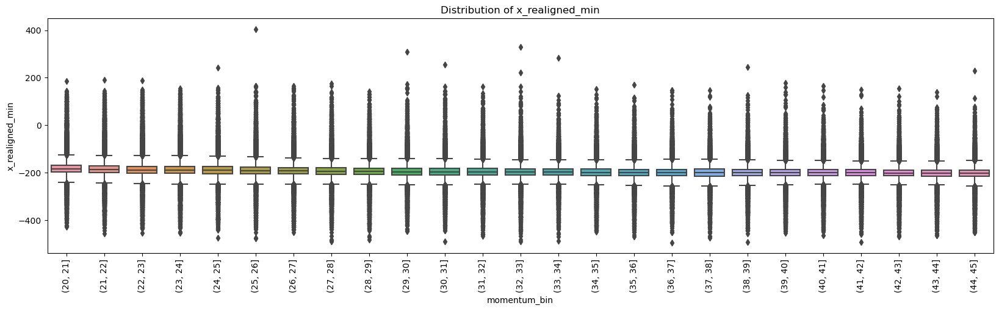

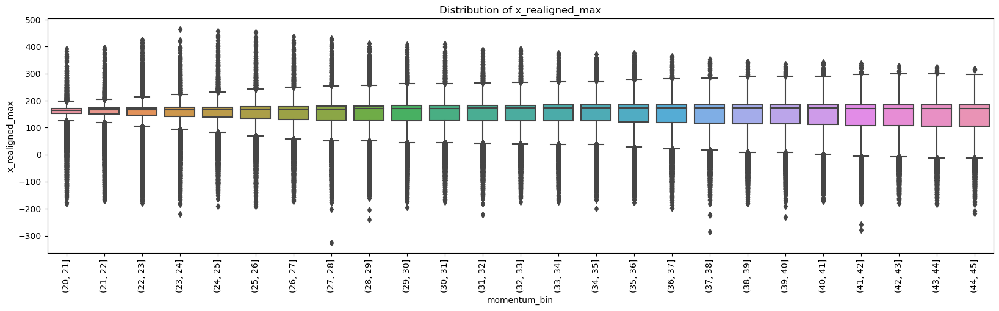

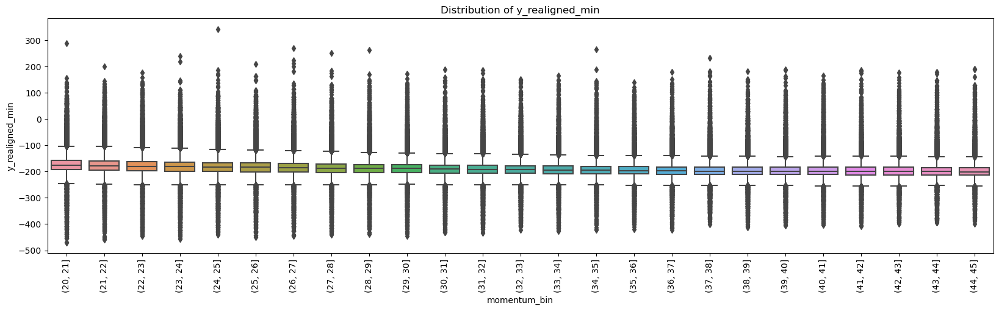

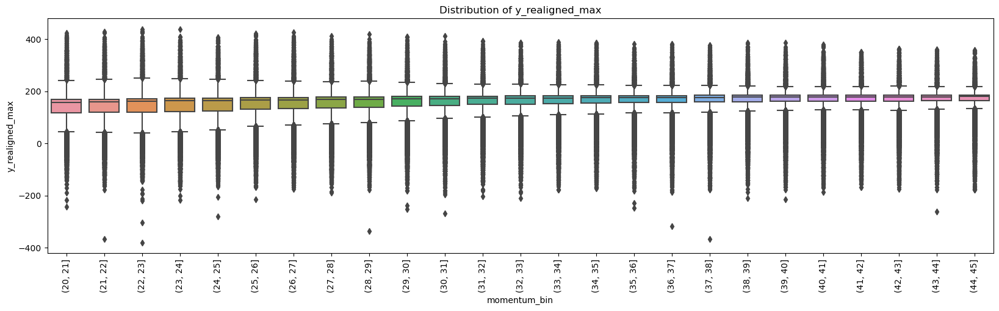

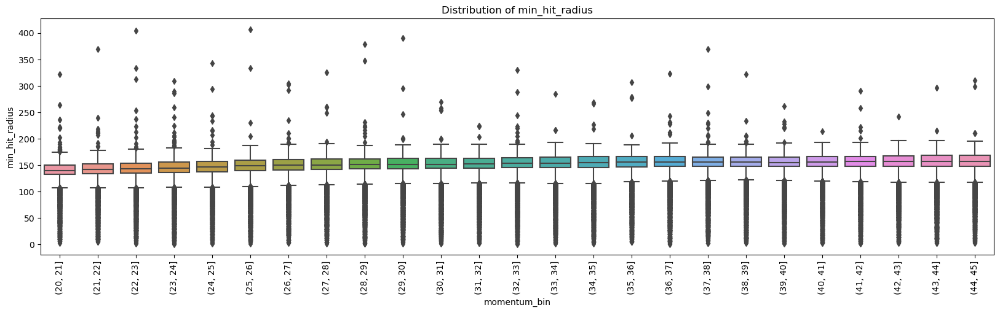

...

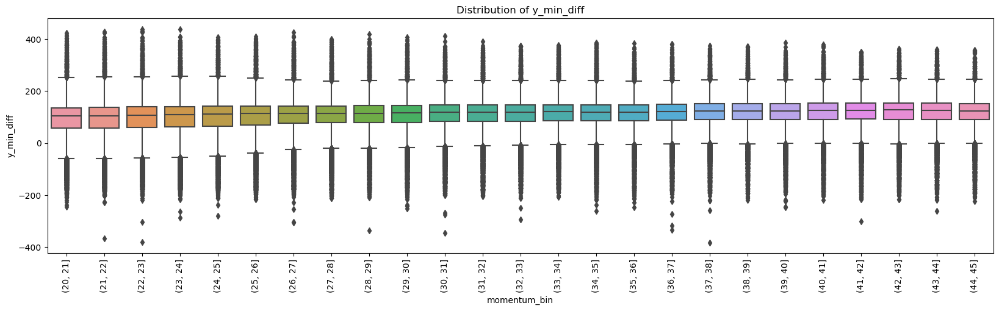

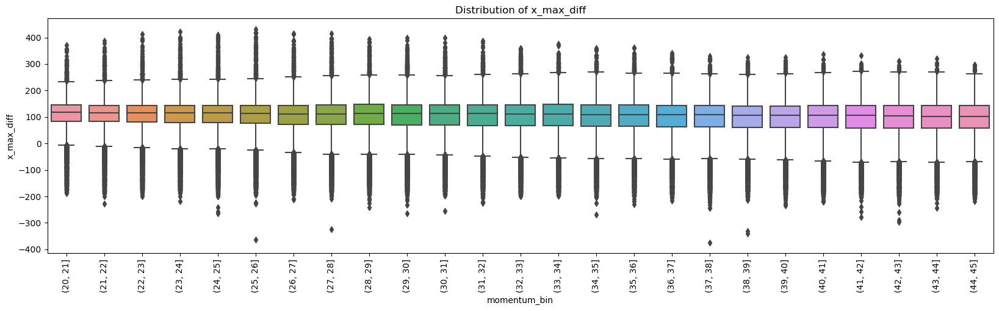

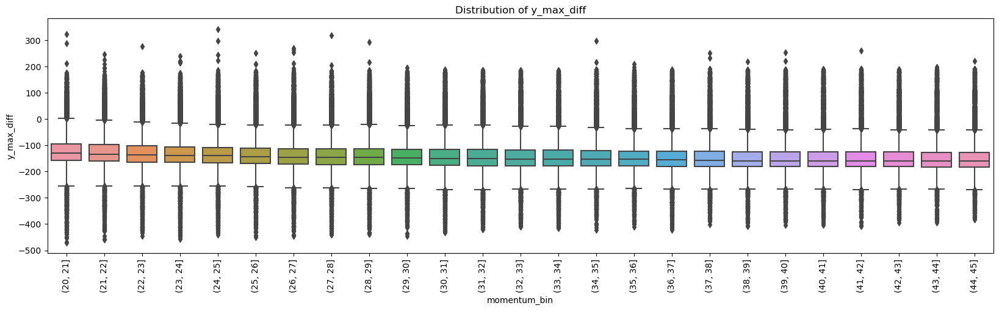

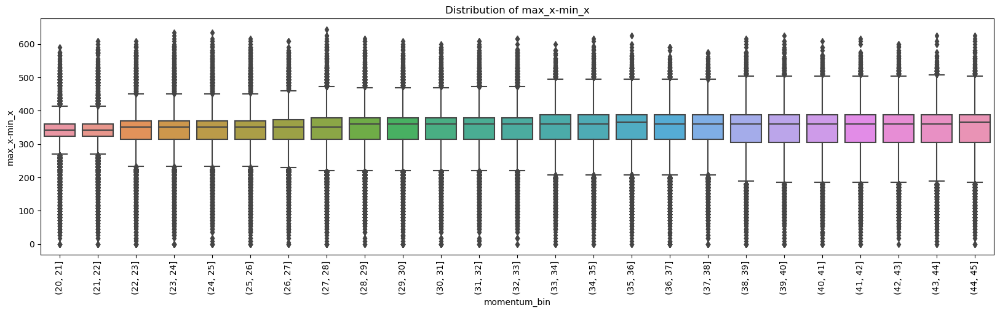

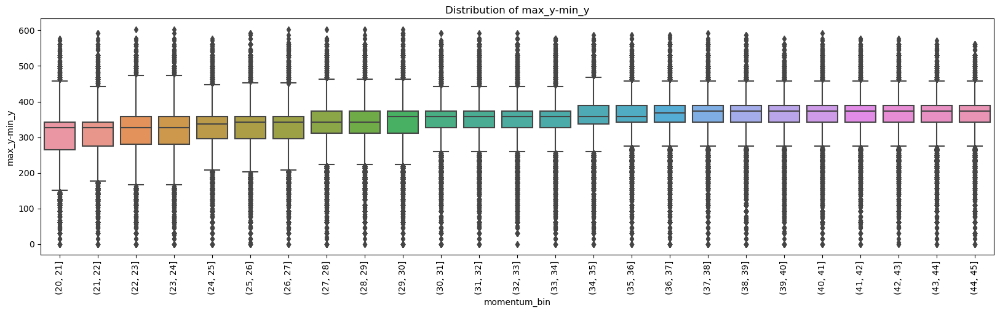

In [48]:
for i in range(1,20):
    sns.boxplot(data = grouped_hit_data, x = 'momentum_bin', y = grouped_hit_data.columns[i]).set(title = f'Distribution of {grouped_hit_data.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()


### 3.2 Boxplots of each feature vs. calculated radius bins 

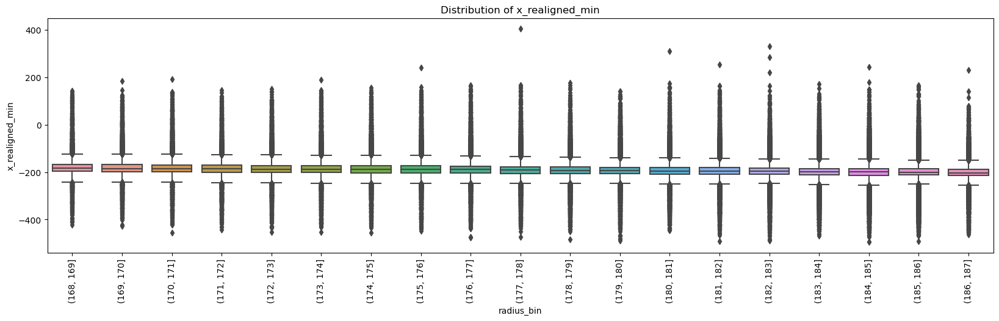

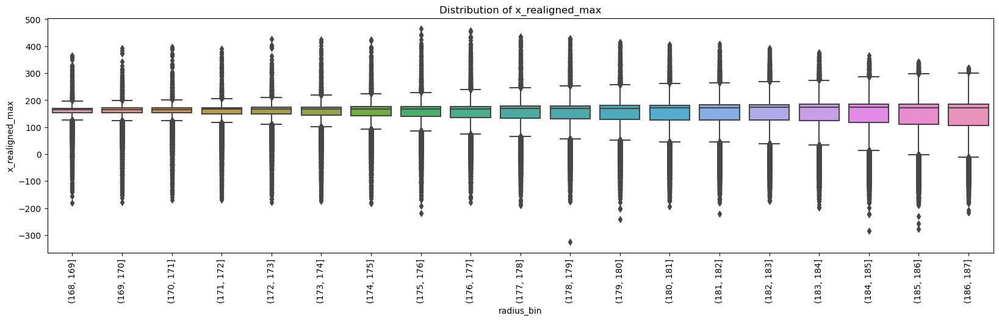

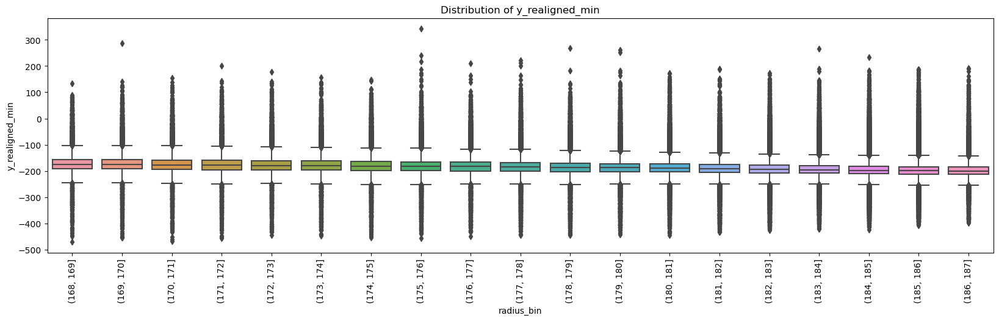

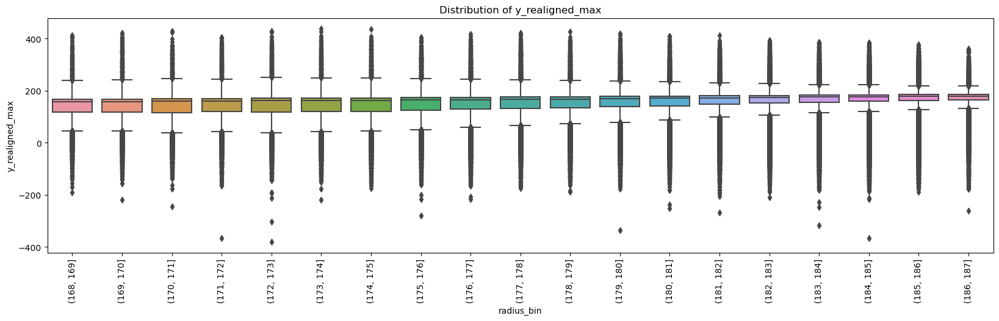

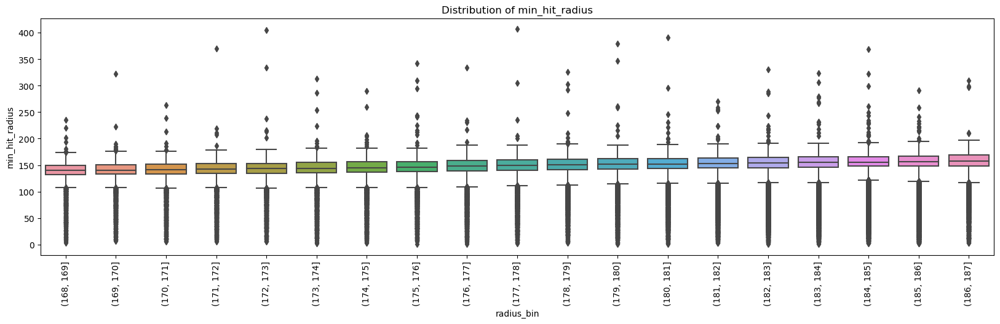

...

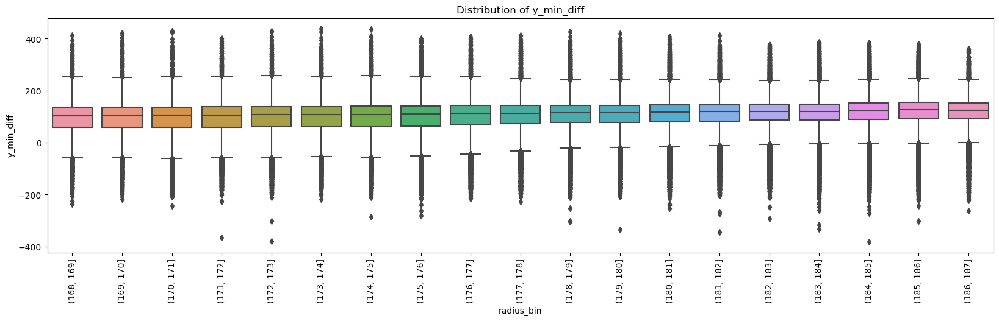

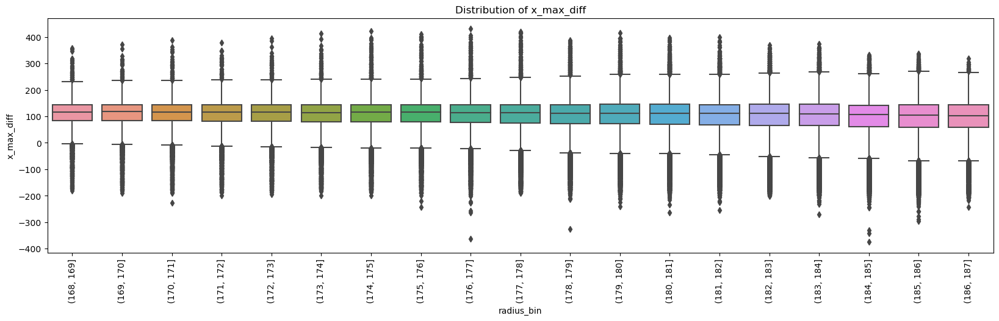

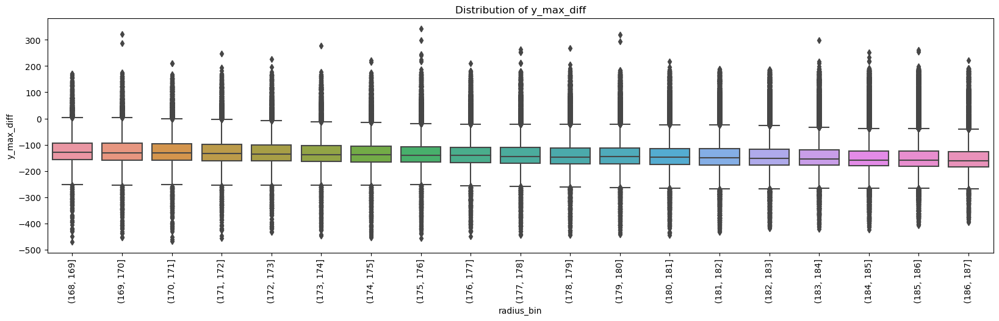

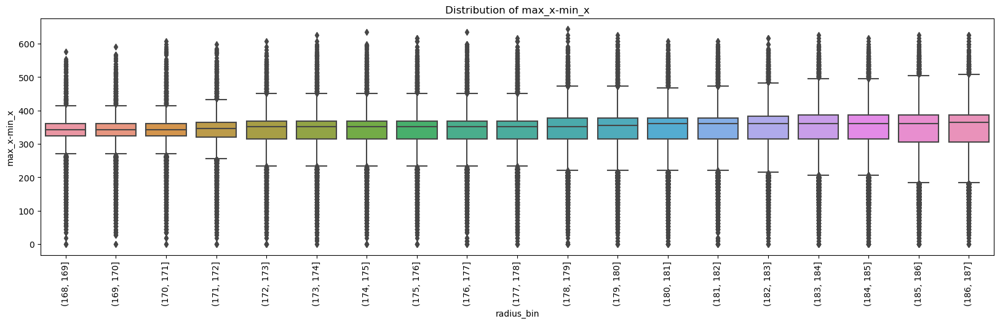

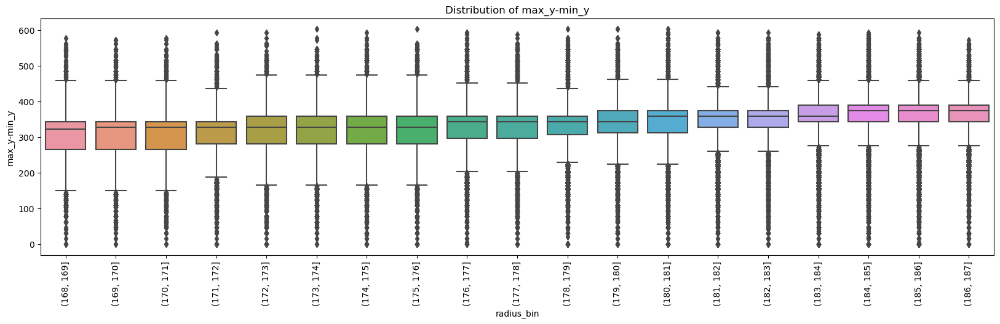

In [49]:
for i in range(1,20):
    sns.boxplot(data = grouped_hit_data, x = 'radius_bin', y = grouped_hit_data.columns[i]).set(title = f'Distribution of {grouped_hit_data.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()

#### Slice the data with momentum range from 20 to 25 GeV/c

In [50]:
grouped_hit_data_slice = grouped_hit_data.query('track_momentum >= 20 & track_momentum <= 25')

In [51]:
bins_slice = np.arange(168, 178, 1)
grouped_hit_data_slice['radius_bin_slice'] = pd.cut(grouped_hit_data_slice['ring_radius_cal'], bins=bins_slice)

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_25878/3206556281.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped_hit_data_slice['radius_bin_slice'] = pd.cut(grouped_hit_data_slice['ring_radius_cal'], bins=bins_slice)


### 3.3 Histograms showing distribution of each feature, faceted by radius bins using data sliced for momentum in range 20-25 GeV/c

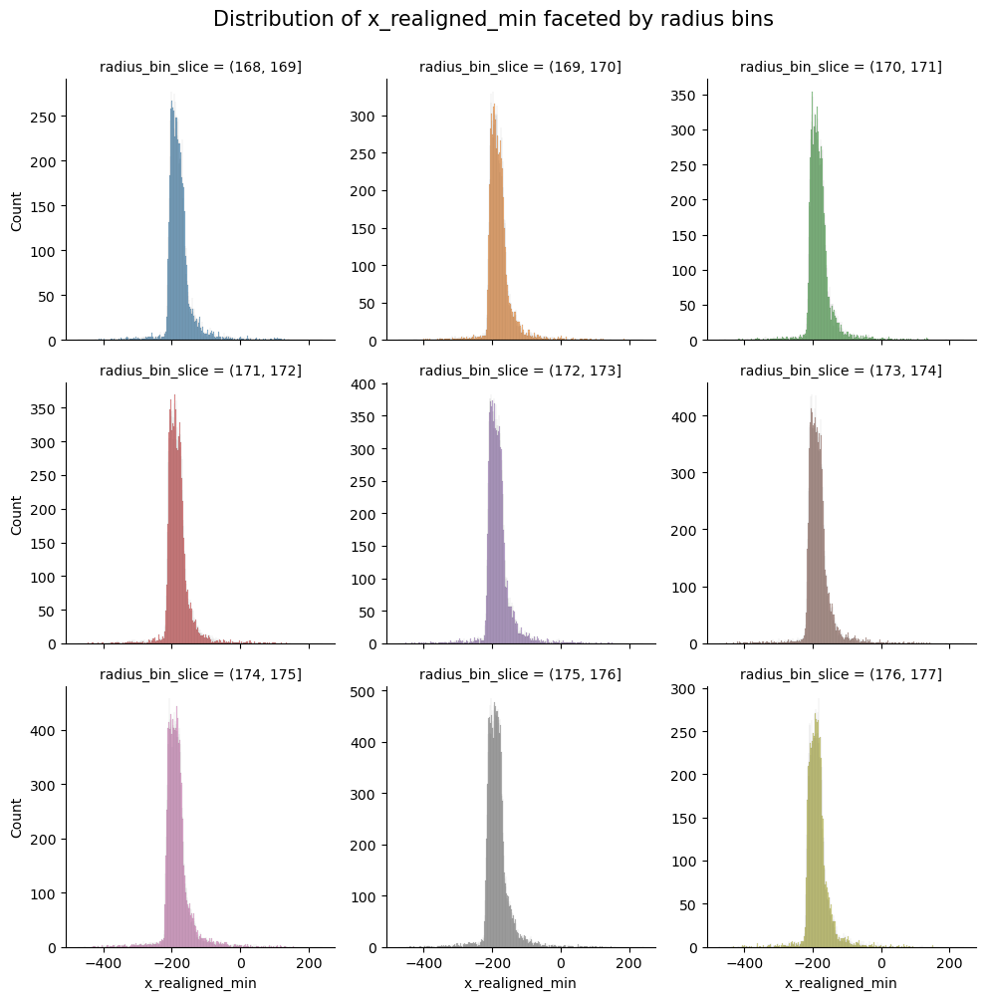

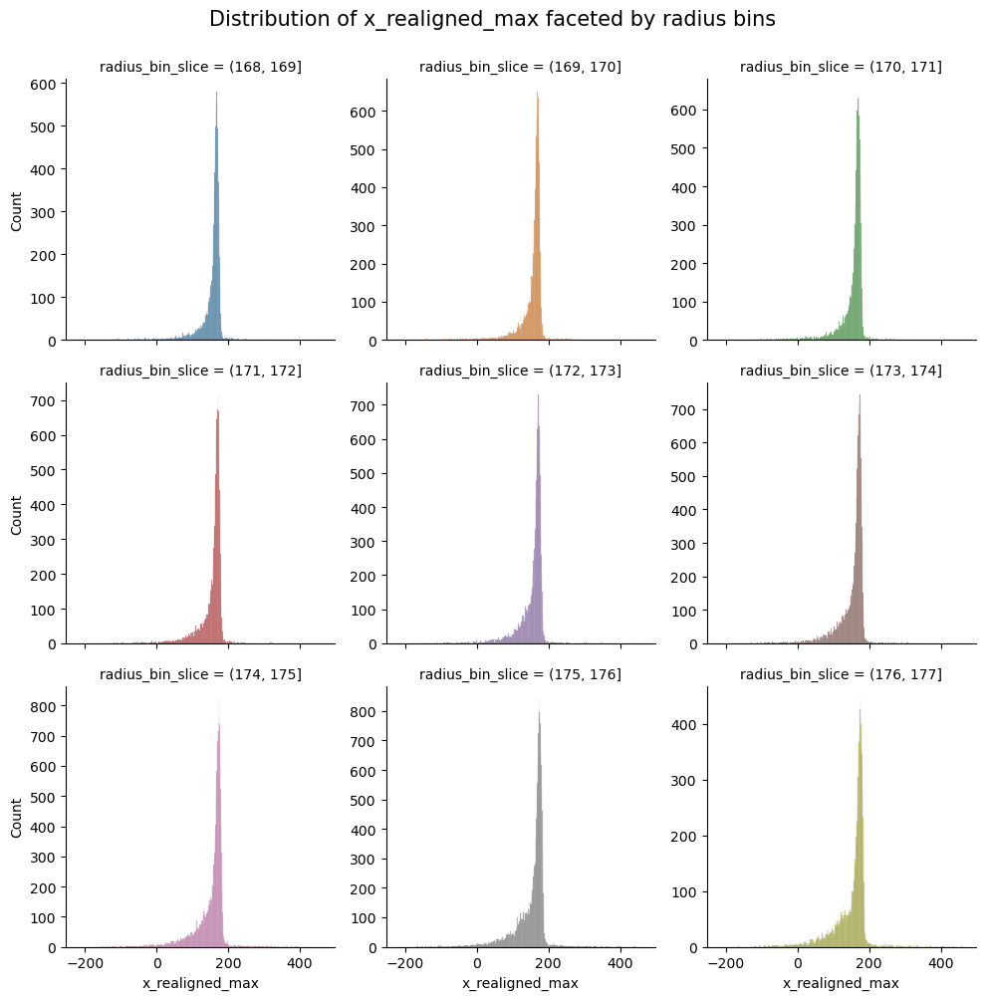

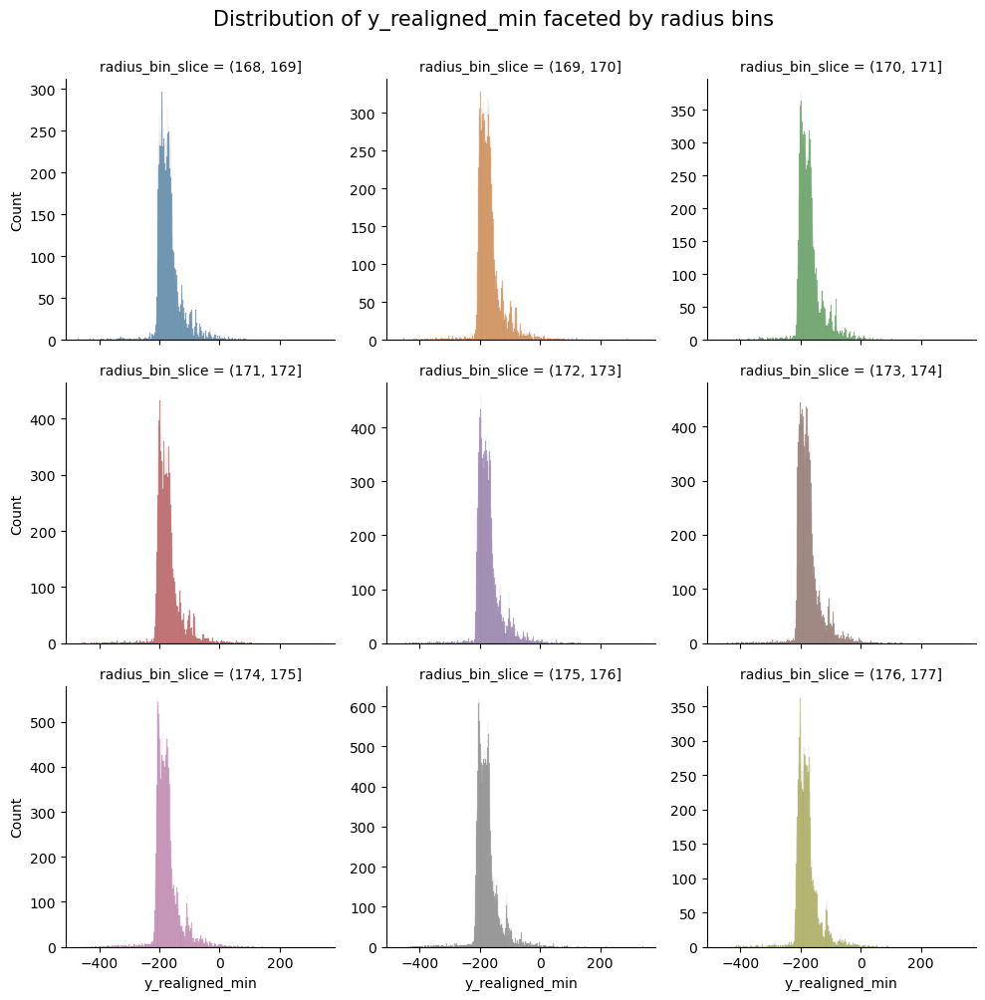

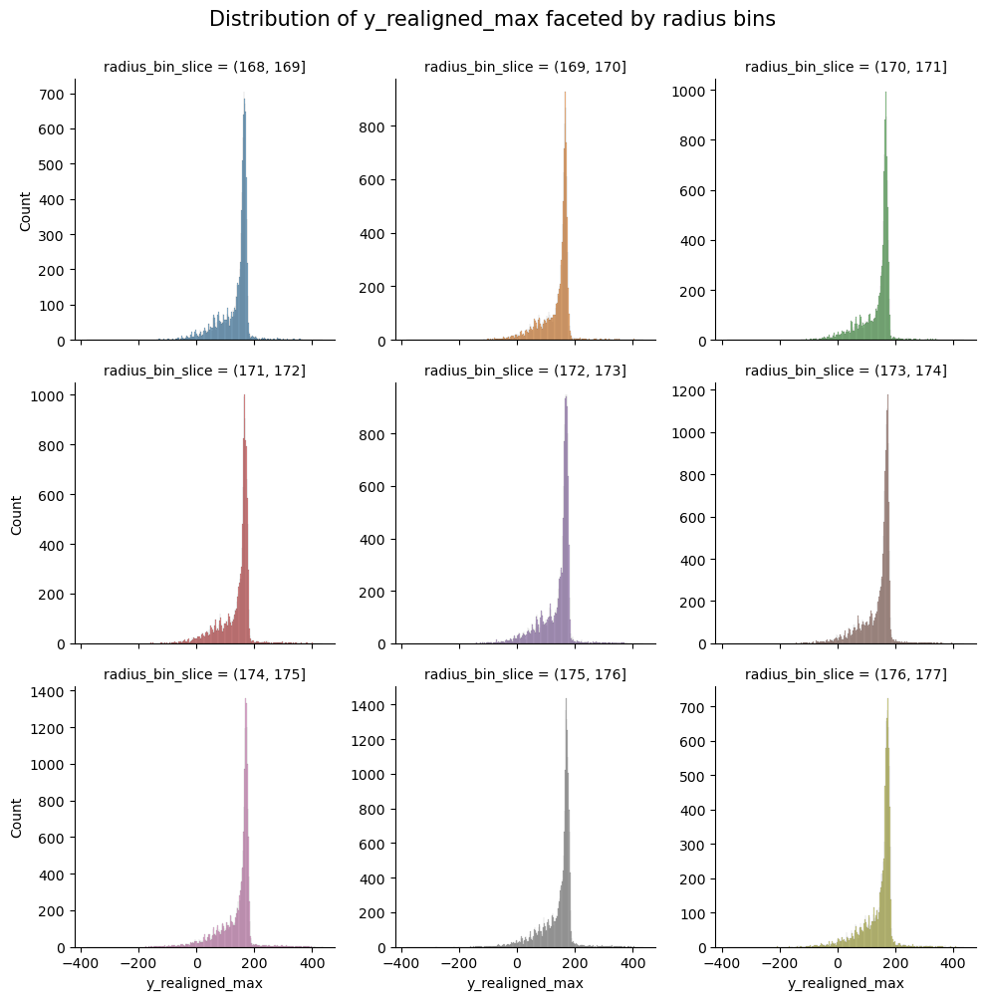

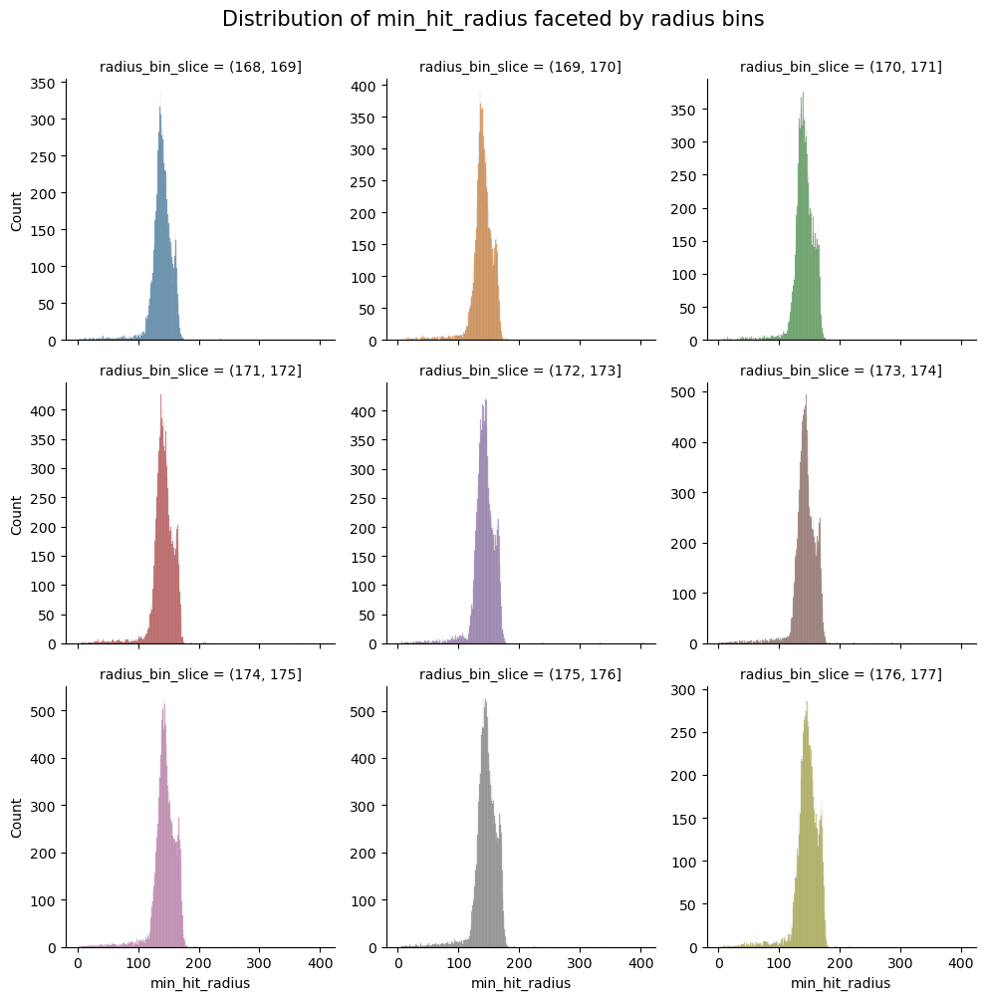

...

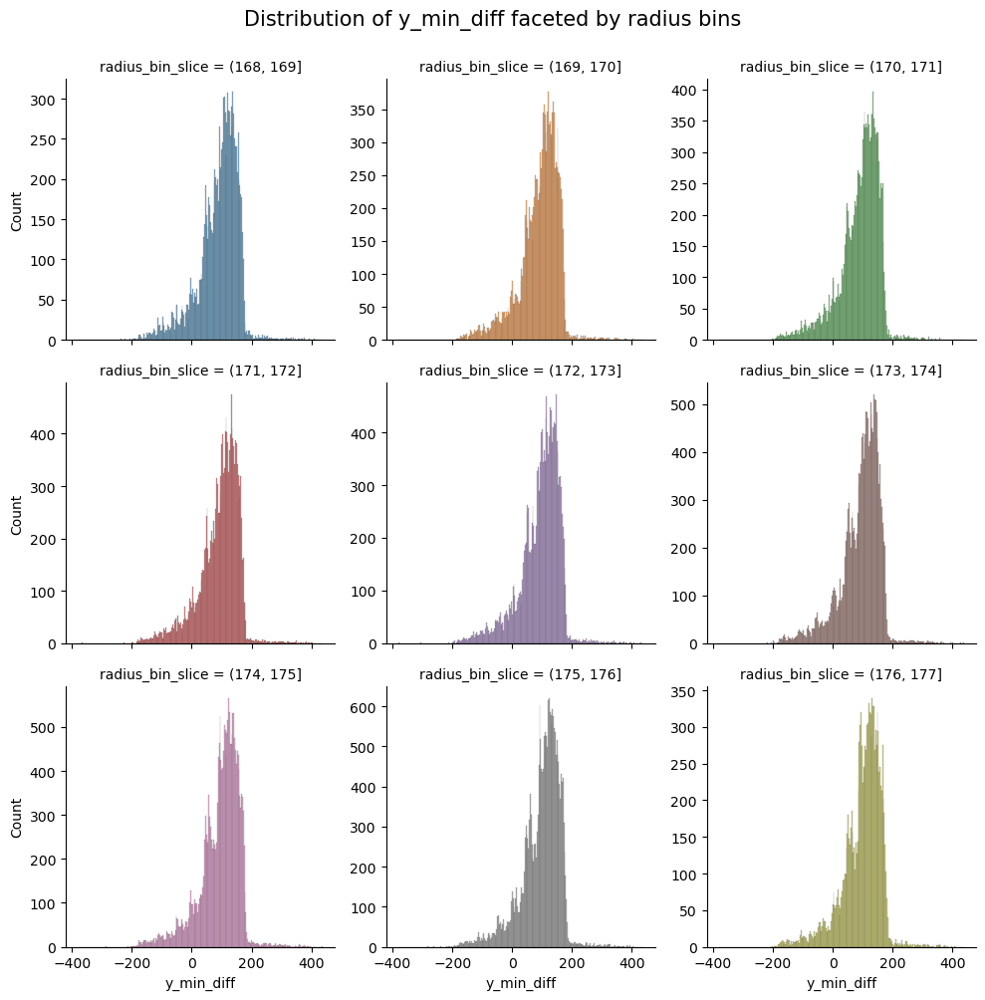

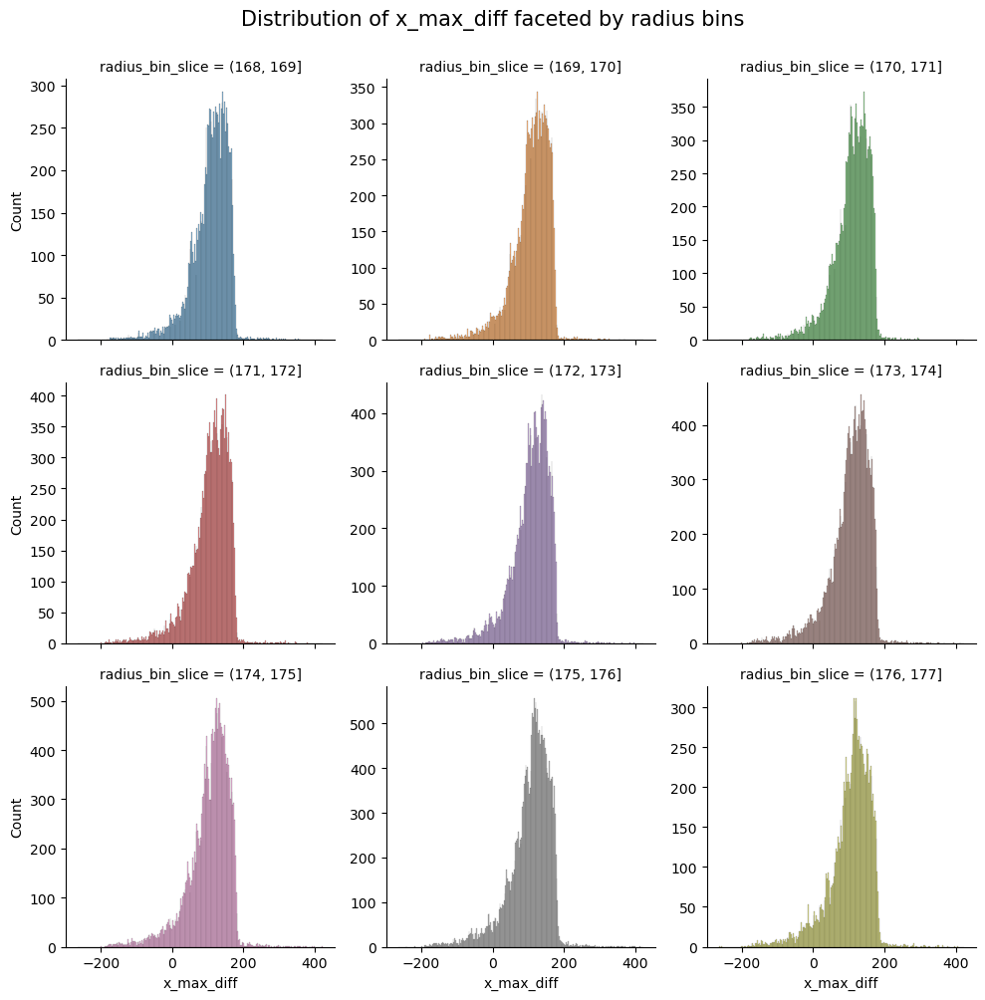

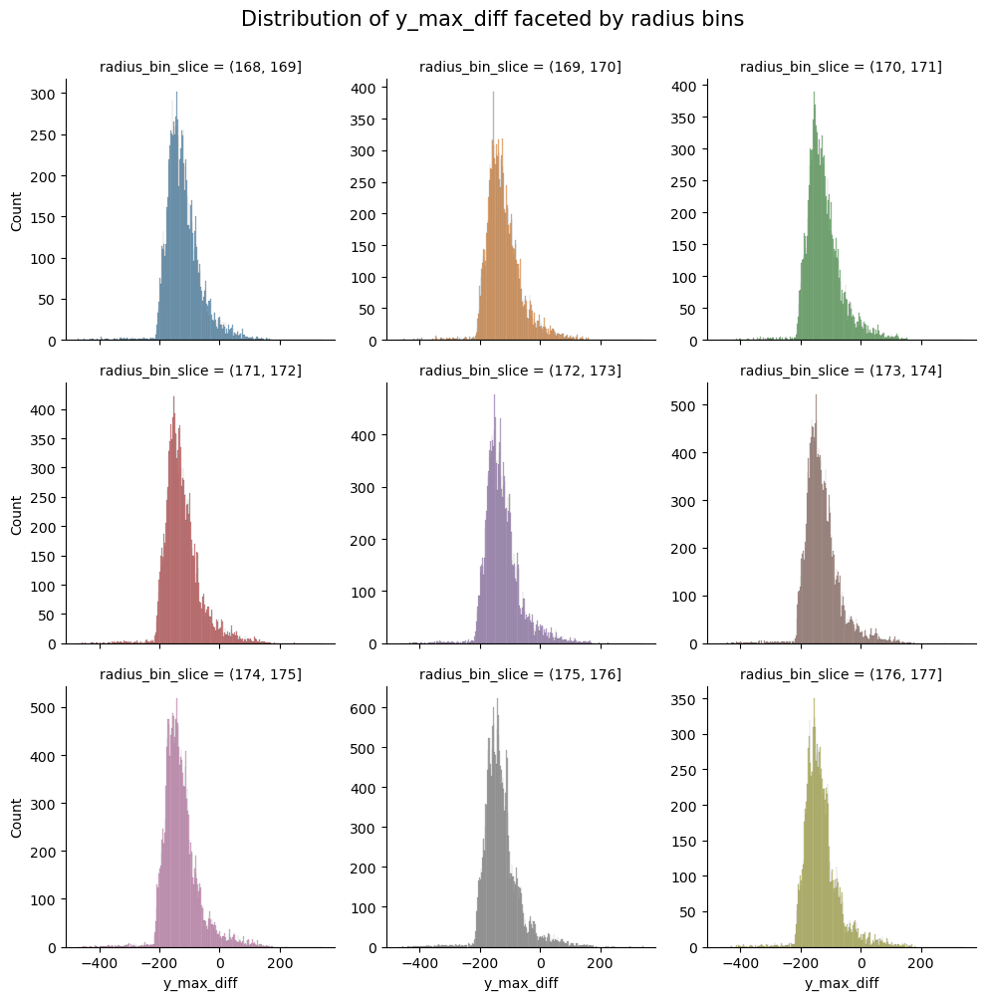

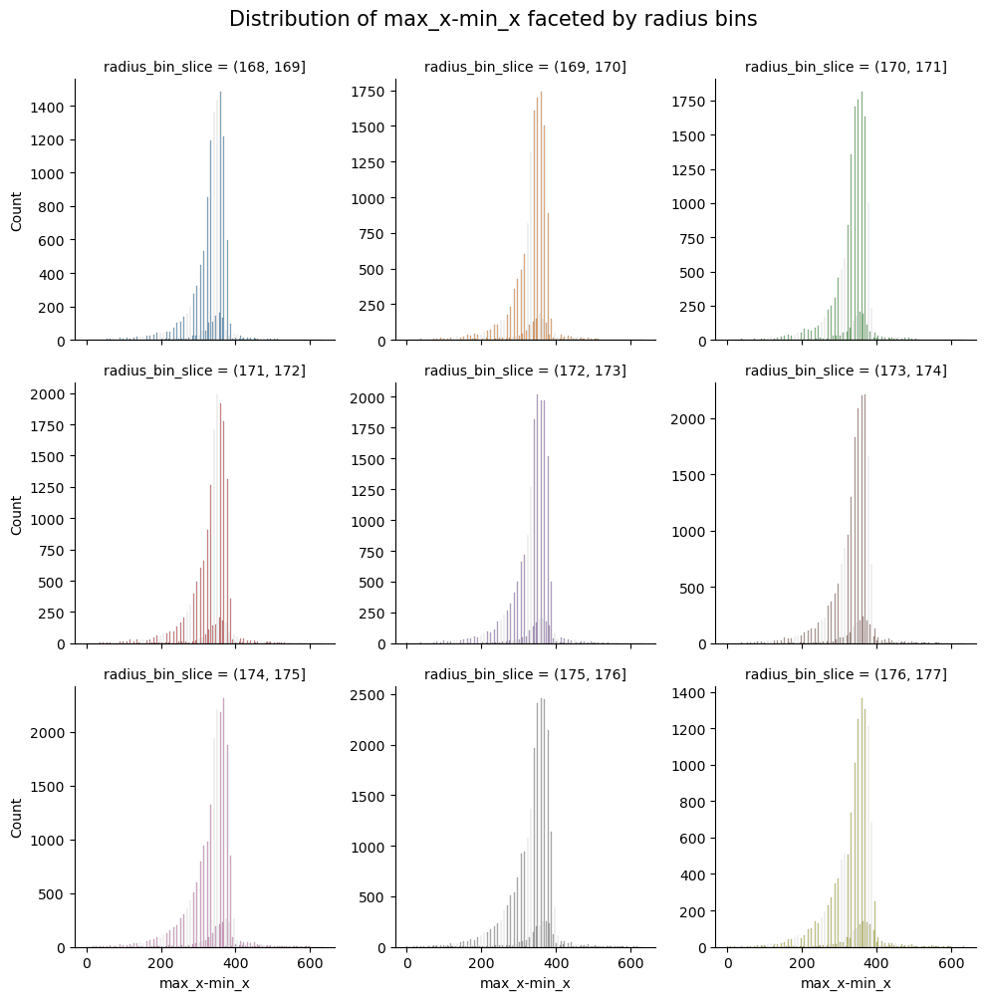

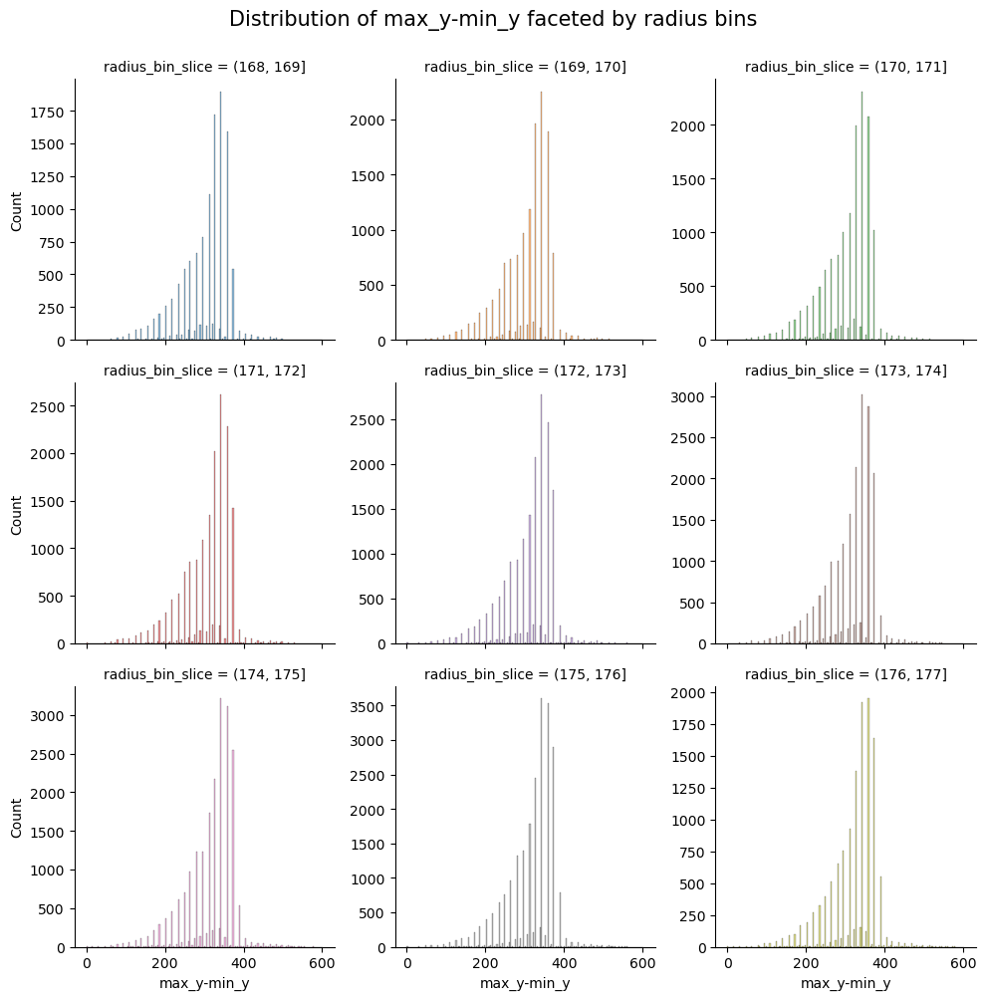

In [52]:
for i in range(1, 20):

    g = sns.displot(
        data=grouped_hit_data_slice,
        x=grouped_hit_data_slice.columns[i],
        hue="radius_bin_slice",
        col='radius_bin_slice',
        col_wrap=3,
        facet_kws=dict(sharey=False),
        legend=False
)

    g.fig.suptitle(f"Distribution of {grouped_hit_data_slice.columns[i]} faceted by radius bins", y=1, fontsize=15)
    g.set_titles(size=10)
    g.set_ylabels(fontsize=10)
    g.fig.set_figheight(10)
    g.fig.set_figwidth(10)

    
    plt.tight_layout()
    plt.show()

### 3.4 Scatter plot showing calculated ring radius vs. all the features with data sliced for momentum in range 20-25 GeV/c

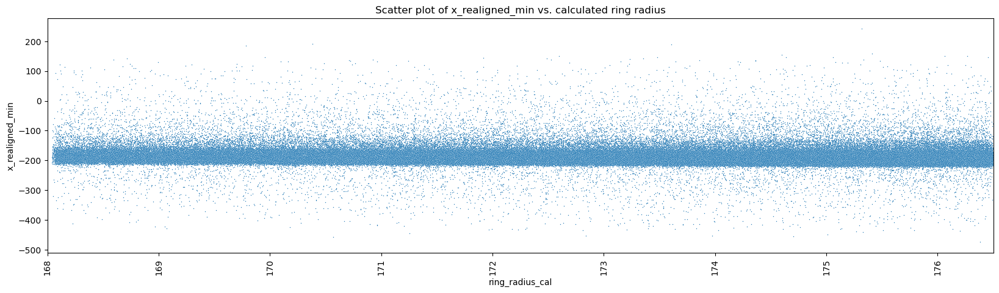

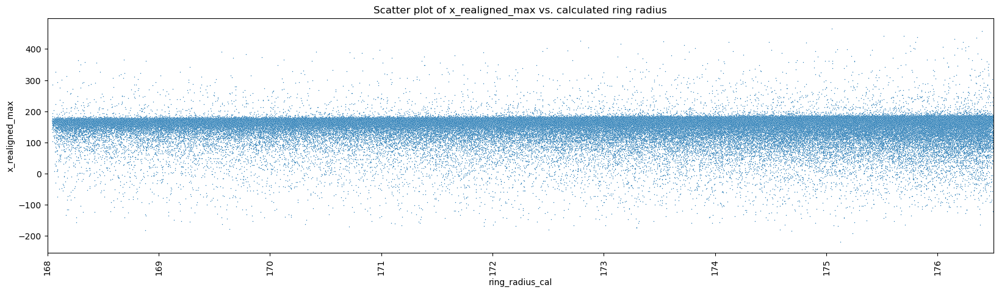

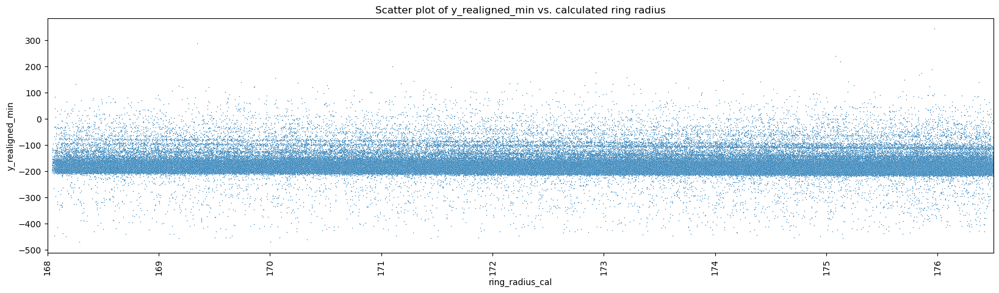

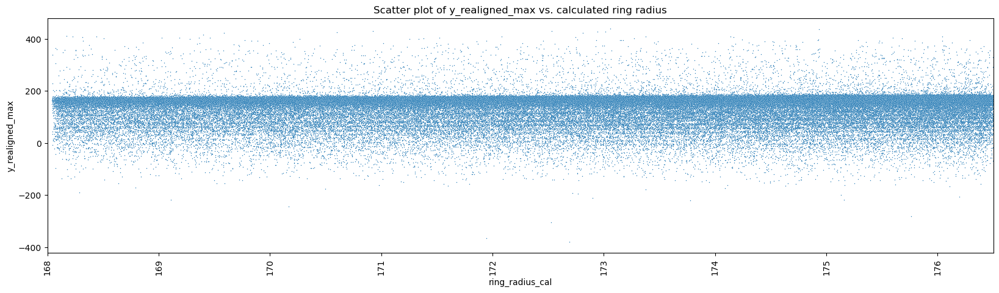

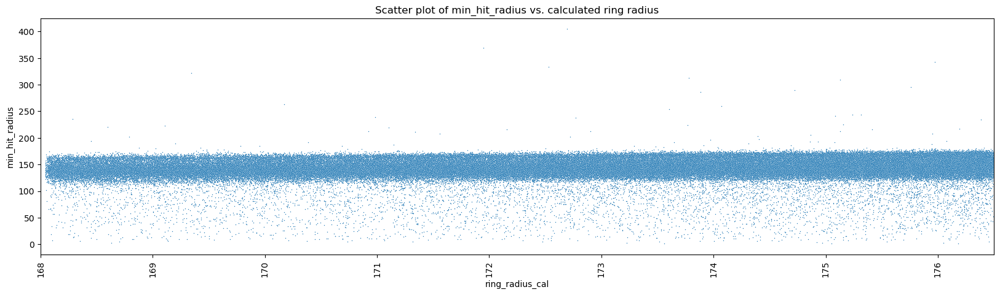

...

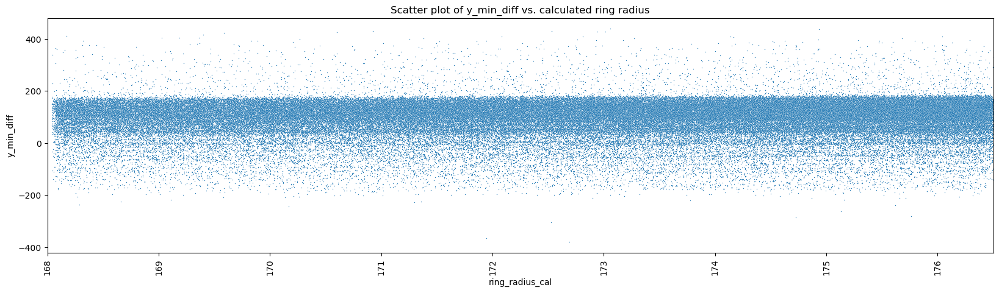

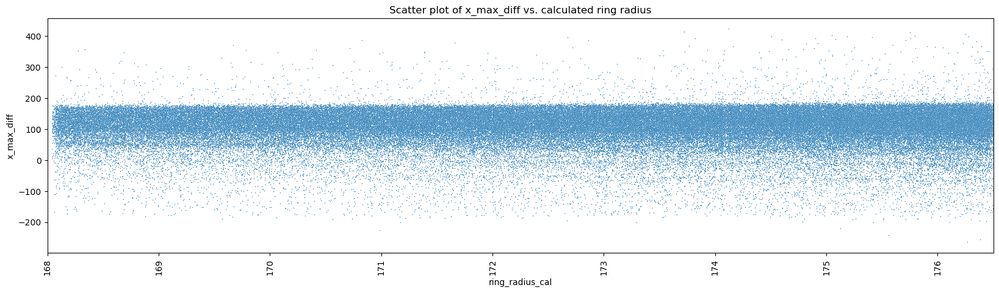

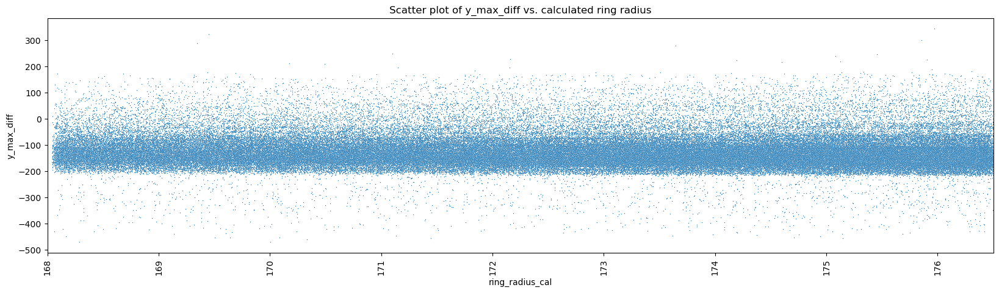

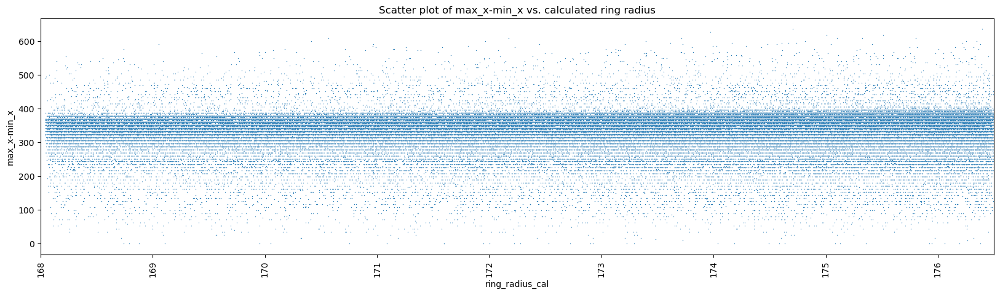

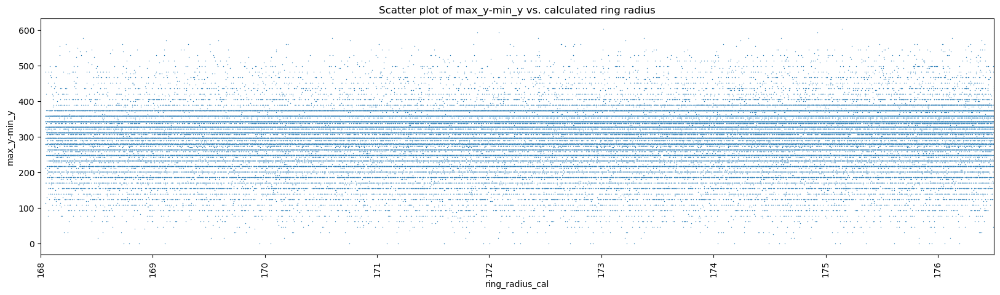

In [53]:
for i in range(1,20):
    g = sns.scatterplot(data = grouped_hit_data_slice, x = 'ring_radius_cal', y = grouped_hit_data.columns[i], s=1)
    g.set(xlim = (168, 176.5))

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.title(f'Scatter plot of {grouped_hit_data.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


### 3.5 2D histograms showing calculated ring radius vs. all the features with data sliced for momentum in range 20-25 GeV/c

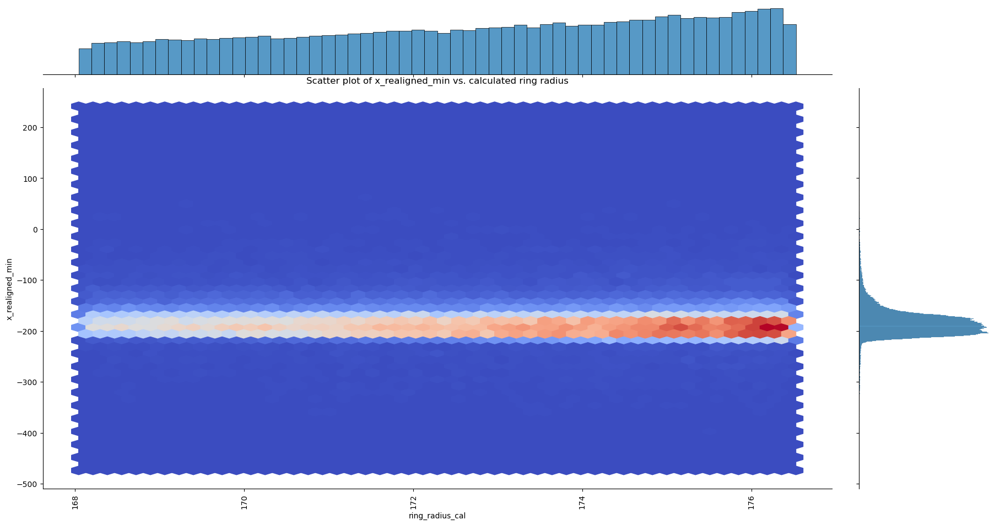

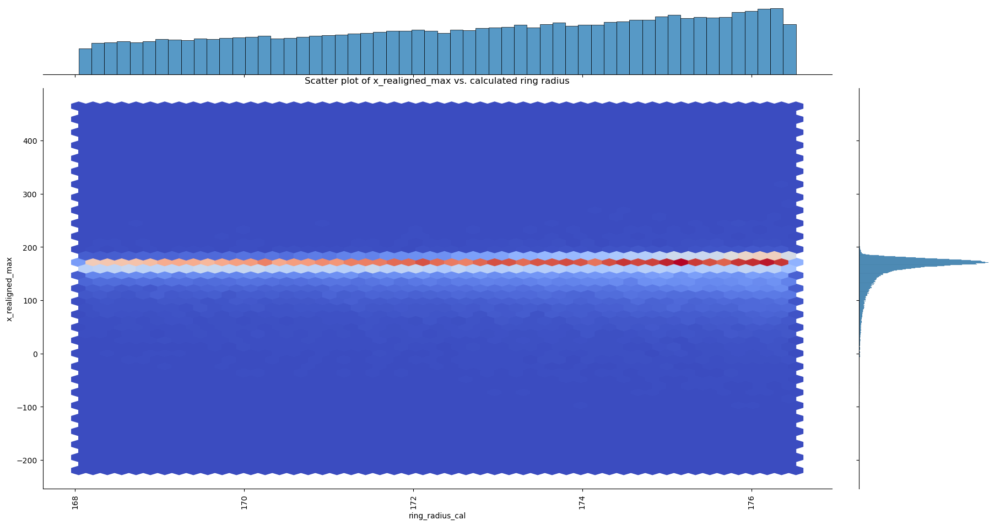

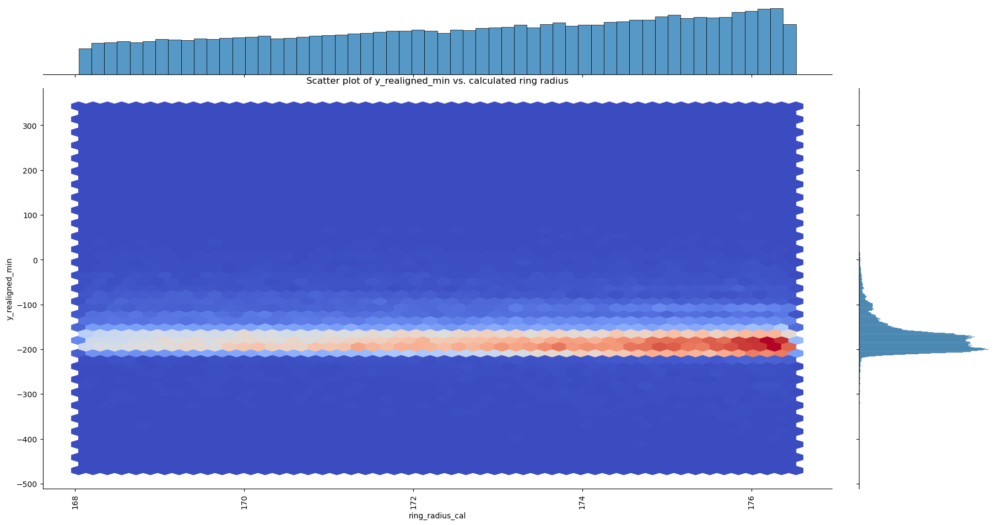

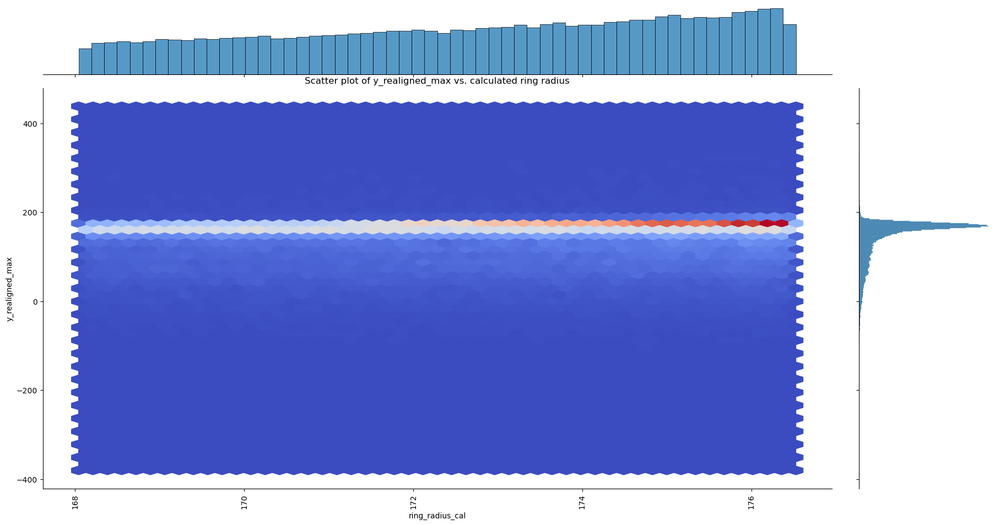

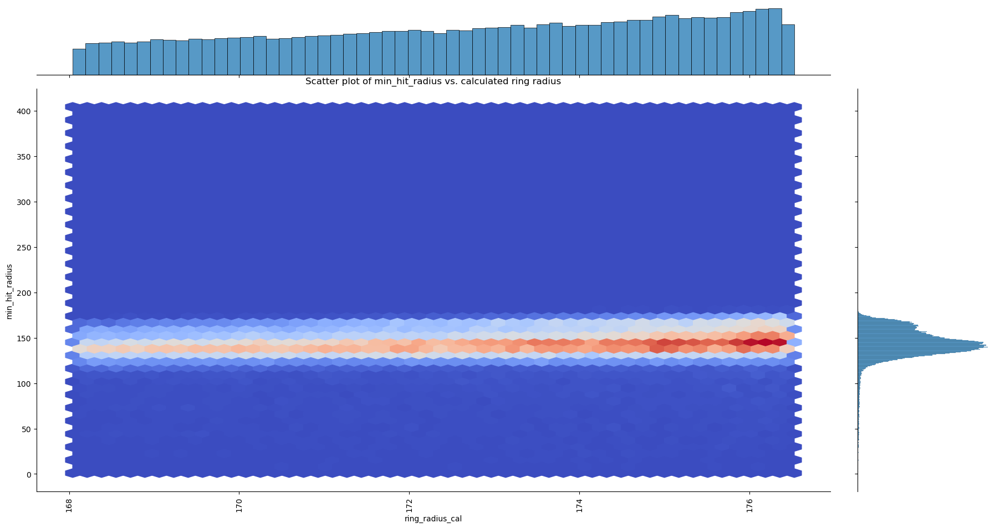

...

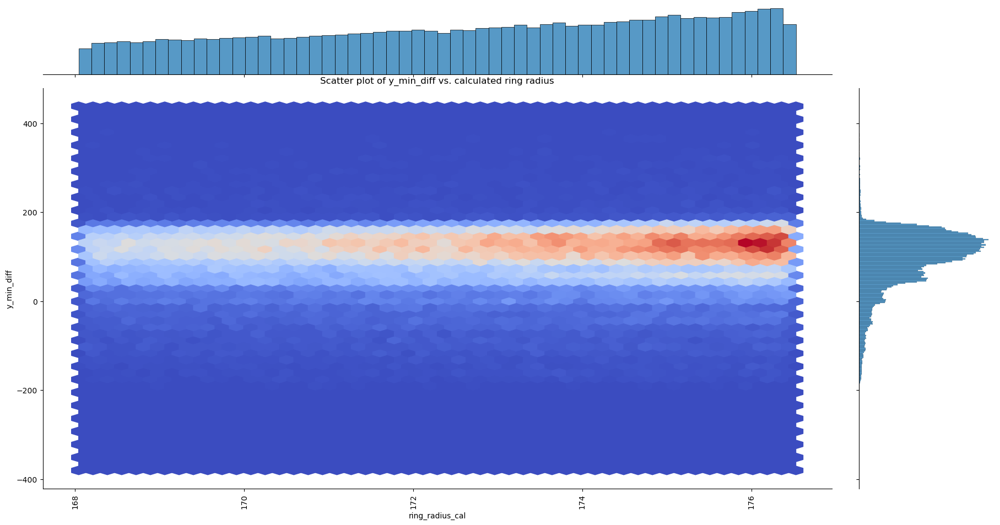

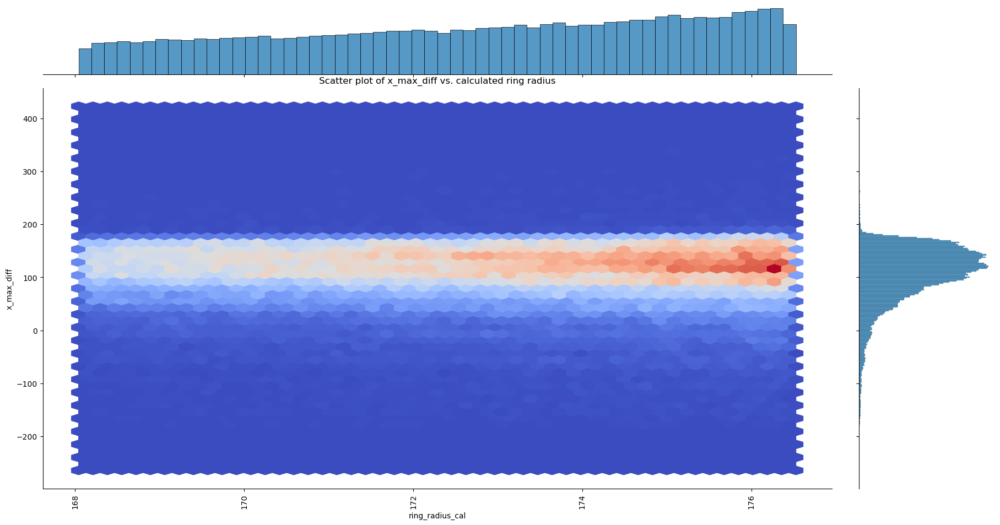

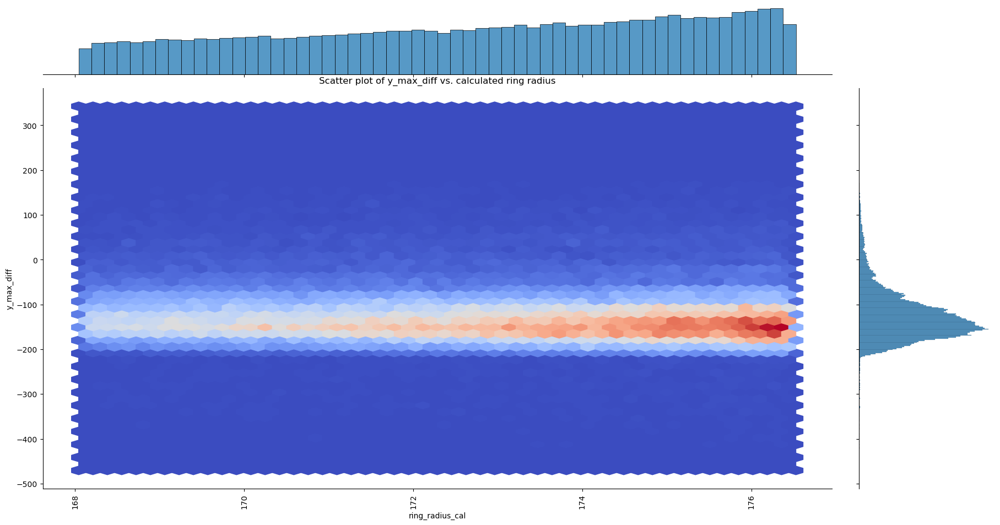

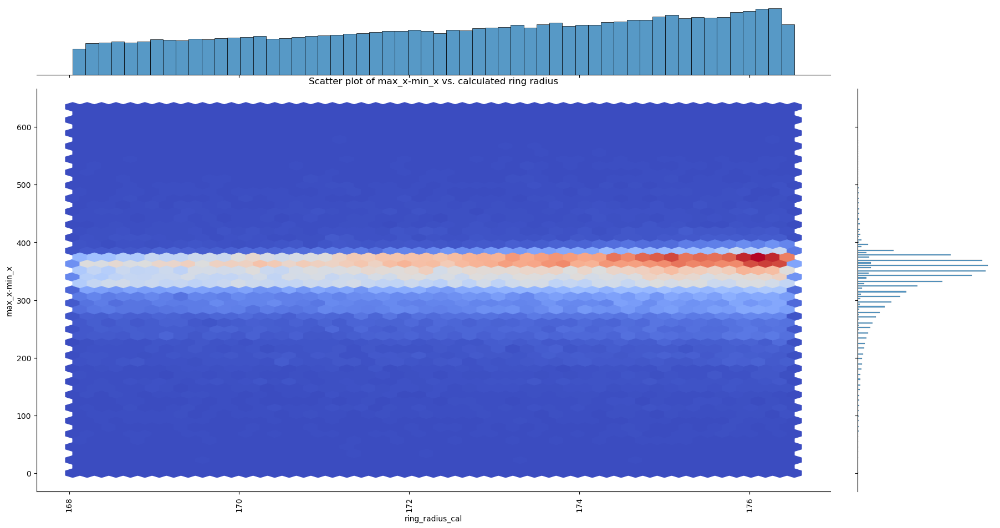

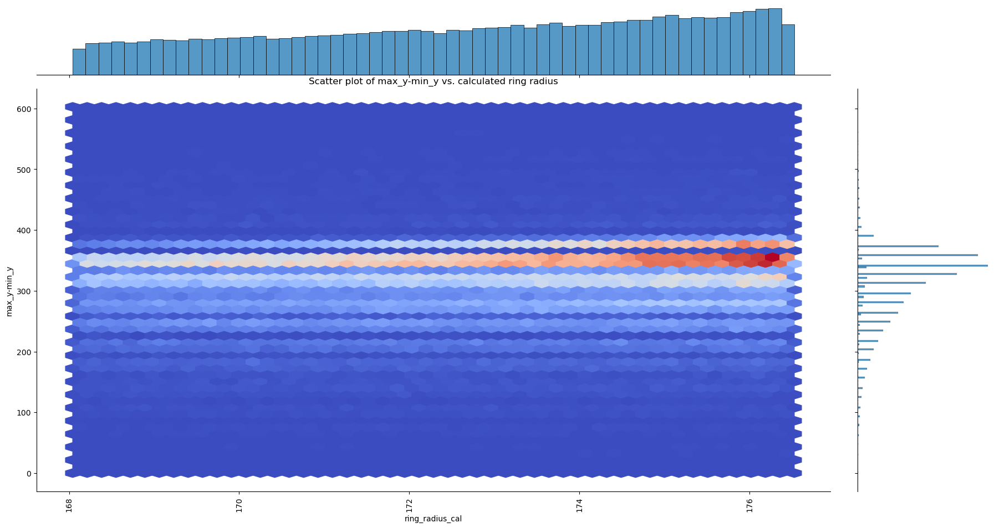

In [54]:
for i in range(1,20):
    g = sns.jointplot(data=grouped_hit_data_slice, x = 'ring_radius_cal', y = grouped_hit_data.columns[i], kind='hex', cmap='coolwarm')
    # g.set(xlim = (168, 176.5))

    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    plt.title(f'Scatter plot of {grouped_hit_data.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


## 4. Training 

#### Section 4 contains the following sub-sections:

- 4.1 Performance of `XGBRegressor` with default hyperparameters 

- 4.2 Hyperparameter optimization on `XGBRegressor`
- 4.3 Performance of optimized `XGBRegressor` with `Dart` booster 
- 4.4 Performance of optimized `XGBRegressor` with features transformed by `PolynomialFeatures` 
- 4.5 Performance of optimized `XGBRegressor` with `median_hit_radius` only
- 4.6 Comparison of the residuals between the optimized `XGBRegressor` and SOTA
- 4.7 Plots showing relationship between `track_momentum` and calculated ring radius vs. `median_hit_radius`
- 4.8 Plots of residual ditribution from `XGBRegressor` in 5 radius bins 
- 4.9 Performance comparison with `RandomForestRegressor`
- 4.10 Performance comparison with `LightGBM`
- 4.11 Performance comparison with `CatBoostRegressor` 
- 4.12 Correlation heatmap between features


### 4.1 Testing the model with default hyperparameters 

#### Train test split 

In [55]:
train_df, test_df = train_test_split(grouped_hit_data, random_state=42)

In [56]:
X_train = train_df.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_train = train_df['ring_radius_cal']
X_test = test_df.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_test = test_df['ring_radius_cal']

#### 4.1.1 Fitting the `XGBRegressor` model

In [57]:
xgb_reg = xgb.XGBRegressor()

In [58]:
reg_metrics = ['neg_root_mean_squared_error', 'r2']

In [59]:
from sklearn.model_selection import cross_val_score, cross_validate, RandomizedSearchCV

In [60]:
xgb_reg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.1.2 Cross validate

In [61]:
xgb_cv = cross_validate(xgb_reg, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [62]:
pd.DataFrame(xgb_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,21.193171,0.041098,-1.986175,-1.898234,0.829669,0.845407
1,20.772090,0.034633,-1.974568,-1.901544,0.831368,0.844931
2,21.210093,0.034616,-1.980113,-1.900692,0.832591,0.844572
3,21.280538,0.032333,-1.983130,-1.898628,0.831909,0.844949
4,21.132335,0.033798,-1.994946,-1.895475,0.829140,0.845637


#### 4.1.3 Predict and score on the test set

In [63]:
from sklearn.metrics import r2_score

In [64]:
ypred = xgb_reg.predict(X_test)
r2 = r2_score(y_test, ypred)
r2

0.8307010606634461

In [65]:
pred_df = pd.DataFrame(ypred, y_test).reset_index()
pred_df.columns=['theoretical_radius', 'predicted_radius']

In [66]:
pd.DataFrame(ypred, y_test).reset_index()

,ring_radius_cal,0
0,183.571647,183.490875
1,178.400346,175.480026
2,172.881030,172.851349
3,177.422429,180.659592
4,183.052409,182.219788
...,...,...
196466,174.740016,175.270294
196467,185.846299,184.380234
196468,185.066107,184.063110
196469,185.483867,184.537170


In [67]:
pred_df

,theoretical_radius,predicted_radius
0,183.571647,183.490875
1,178.400346,175.480026
2,172.881030,172.851349
3,177.422429,180.659592
4,183.052409,182.219788
...,...,...
196466,174.740016,175.270294
196467,185.846299,184.380234
196468,185.066107,184.063110
196469,185.483867,184.537170


#### 4.1.4 Plotting feature importance 

In [68]:
pd.DataFrame({'features': xgb_reg.feature_names_in_, 'importance': xgb_reg.feature_importances_}).sort_values(by='importance', ascending=False)

,features,importance
7,median_hit_radius,0.839068
3,y_realigned_max,0.030523
1,x_realigned_max,0.015041
12,y_max_sum,0.011914
11,x_max_sum,0.010958
4,min_hit_radius,0.009693
17,max_x-min_x,0.009097
18,max_y-min_y,0.007946
10,y_min_sum,0.007575
9,x_min_sum,0.007164


#### 4.1.5 Computing the residuals

In [69]:
pred_df['residual'] = pred_df['theoretical_radius'] - pred_df['predicted_radius']

Text(0, 0.5, 'Residuals')

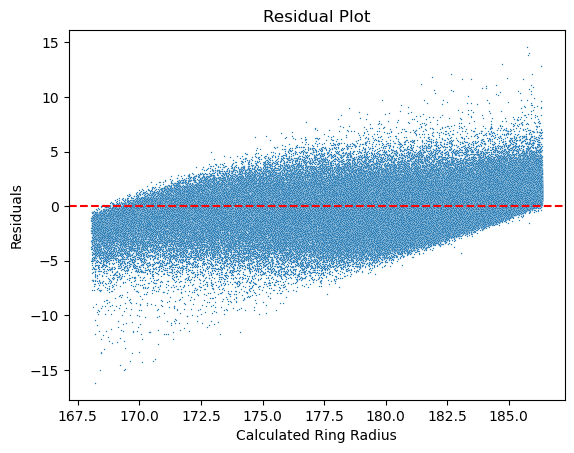

In [70]:
sns.scatterplot(data=pred_df, x='theoretical_radius', y='residual', s=1)

plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

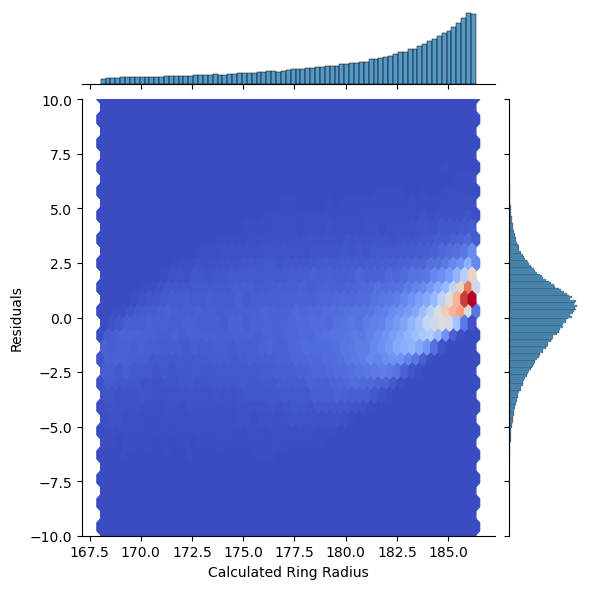

In [71]:
g = sns.jointplot(data=pred_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim = (-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.2 Hyperparameter optimization 

#### Subsetting a smaller sample for hyperparameter optimization

In [72]:
samples_per_bin = 3000

sampled_group = grouped_hit_data.groupby('momentum_bin').apply(lambda x: x.sample(samples_per_bin, random_state=42)).reset_index(drop=True)

sampled_group.reset_index(drop=True, inplace=True)


In [73]:
train_df_subset, test_df_subset = train_test_split(sampled_group, random_state=42)

In [74]:
X_train_subset = train_df_subset.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_train_subset = train_df_subset['ring_radius_cal']
X_test_subset = test_df_subset.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_test_subset = test_df_subset['ring_radius_cal']

#### Hyperparameters included:
- `max_depth`: the maximum depth of trees 
- `learning_rate`: the rate at which each new tree modifies the overall model
- `reg_lambda`: the degree of L2 regularization
- `reg_alpha`: the degree of L1 regularization 
- `n_estimators`: number of trees included in the model 

In [75]:
param_grid = {
    "max_depth": [4, 6, 8, 10],
    "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 0.7],
    "reg_lambda": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
    "reg_alpha": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
    "n_estimators": [100, 300, 500, 700, 900]
}

xgb_tune = XGBRegressor()

random_search = RandomizedSearchCV(
    estimator=xgb_tune,
    param_distributions=param_grid,
    scoring="r2",
    n_iter=20,
    cv=5,
    random_state=42
)

random_search.fit(X_train_subset, y_train_subset)

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_iter=20,
                   param_distributions={'learning_rate': [0.001, 0.01, 0.05,
                                                          0.1, 0.3, 0.5, 0.7],
                                        'max_depth': [4, 6, 8, 10],
                                        'n_estimators': [100, 300, 500, 700,
                                                         900],
                                        'reg_alpha': [0, 0.1, 0.3, 0.5, 0.7,
                                                      0.9],
                                        'reg_lambda': [0, 0.1, 0.3, 0.5, 0.7,
                                                       0.9]},
                   random_state=42, scoring='r2')

In [76]:
best_params = random_search.best_params_
best_score = random_search.best_score_

In [77]:
best_params

{'reg_lambda': 0.5,
 'reg_alpha': 0.5,
 'n_estimators': 500,
 'max_depth': 6,
 'learning_rate': 0.1}

In [78]:
best_score

0.8192926993841464

#### 4.2.1 Showing cv scores on the optimized hyperparameters

In [80]:
xgb_opt = xgb.XGBRegressor(reg_lambda= 0.5,reg_alpha= 0.5, n_estimators= 500, max_depth= 6, learning_rate= 0.1)

In [81]:
xgb_opt_cv = cross_validate(xgb_opt, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [82]:
pd.DataFrame(xgb_opt_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,118.033955,0.208587,-1.953778,-1.829176,0.835180,0.856451
1,124.486022,0.158342,-1.942285,-1.834661,0.836837,0.855647
2,118.232403,0.177985,-1.947840,-1.835907,0.838003,0.854987
3,121.700215,0.148100,-1.950451,-1.829213,0.837403,0.856079
4,120.260610,0.154391,-1.967157,-1.830896,0.833867,0.855976


#### 4.2.2 Fitting the model with the optimized hyperparameters 

In [84]:
xgb_opt.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.2.3 Plotting feature importance

In [85]:
importance = pd.DataFrame({'features': xgb_opt.feature_names_in_, 'importance': xgb_opt.feature_importances_})

In [86]:
importance.sort_values(by='importance', ascending=False)

,features,importance
7,median_hit_radius,0.843112
3,y_realigned_max,0.027029
1,x_realigned_max,0.012930
12,y_max_sum,0.012357
11,x_max_sum,0.010468
4,min_hit_radius,0.009713
18,max_y-min_y,0.008357
10,y_min_sum,0.007985
5,max_hit_radius,0.007560
17,max_x-min_x,0.007516


#### 4.2.4 Computing the residuals 

In [87]:
ypred_opt = xgb_opt.predict(X_test)

In [88]:
pred_opt_df = pd.DataFrame(ypred_opt, y_test).reset_index()
pred_opt_df.columns=['theoretical_radius', 'predicted_radius']
pred_opt_df['residual'] = pred_opt_df['theoretical_radius'] - pred_opt_df['predicted_radius']

Text(0, 0.5, 'Residuals')

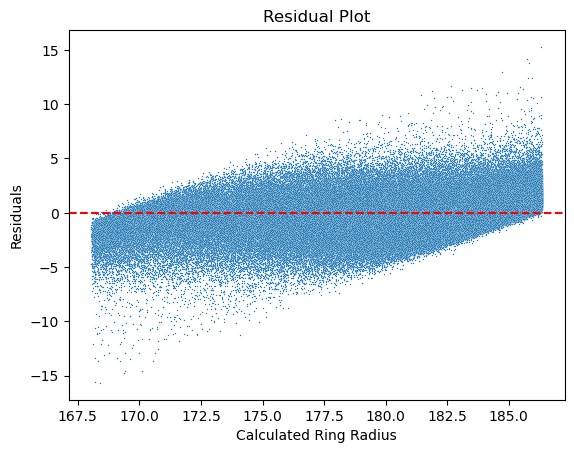

In [89]:
sns.scatterplot(data=pred_opt_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

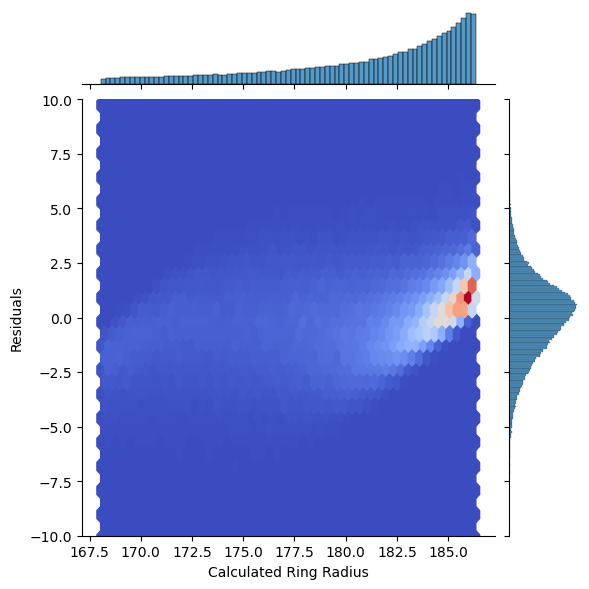

In [90]:
g = sns.jointplot(data=pred_opt_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim = (-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.3 Testing the model with `Dart Booster` 

In [91]:
xgb_dart = xgb.XGBRegressor(reg_lambda= 0.5,reg_alpha= 0.5, n_estimators= 500, max_depth= 6, learning_rate= 0.1, booster='dart')

In [92]:
xgb_dart.fit(X_train, y_train)

XGBRegressor(base_score=None, booster='dart', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [93]:
xgb_dart.score(X_train, y_train)

0.8532765932616586

In [94]:
xgb_dart.score(X_test, y_test)

0.8357861064524785

In [95]:
ypred_dart = xgb_dart.predict(X_test)


In [96]:
pred_dart_df = pd.DataFrame(ypred_dart, y_test).reset_index()
pred_dart_df.columns=['theoretical_radius', 'predicted_radius']
pred_dart_df['residual'] = pred_dart_df['theoretical_radius'] - pred_dart_df['predicted_radius']

Text(0, 0.5, 'Residuals')

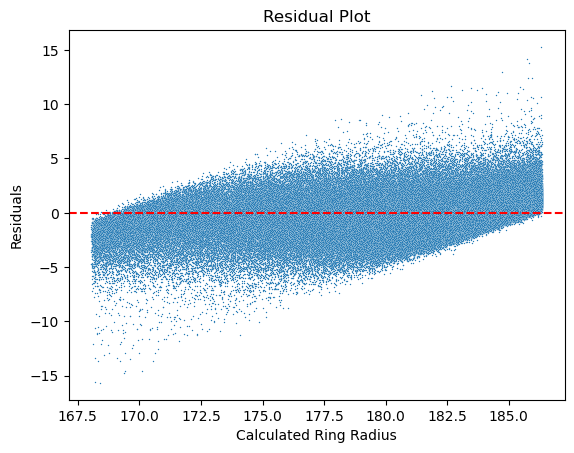

In [97]:
sns.scatterplot(data=pred_dart_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

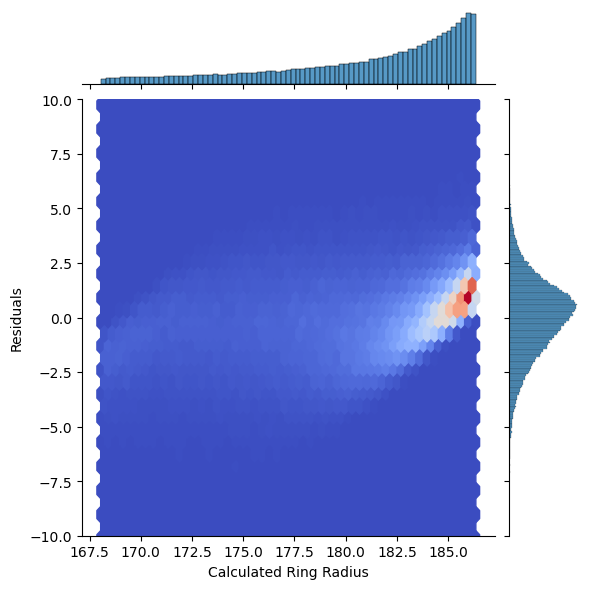

In [98]:
g = sns.jointplot(data=pred_dart_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.4 Transform the features using `PolynomialFeatures`

#### 4.4.1 Transforming the training data to a degree of 2 

In [99]:
from sklearn.preprocessing import PolynomialFeatures

deg = 2
poly_feats = PolynomialFeatures(degree=deg)
X_enc = poly_feats.fit_transform(X_train)
pd.DataFrame(X_enc, columns=poly_feats.get_feature_names_out()).head()

,1,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,...,x_max_diff^2,x_max_diff y_max_diff,x_max_diff max_x-min_x,x_max_diff max_y-min_y,y_max_diff^2,y_max_diff max_x-min_x,y_max_diff max_y-min_y,max_x-min_x^2,max_x-min_x max_y-min_y,max_y-min_y^2
0,1.0,-214.277405,100.722595,-197.621716,145.328288,164.701538,218.965076,190.777502,186.964652,191.314297,...,8413.034434,-18126.376628,28892.617425,31456.264375,39054.342668,-62250.840567,-67774.368436,99225.0,108029.251442,117614.705640
1,1.0,-166.437600,175.562400,-203.559470,170.560533,121.542441,210.867780,167.952997,168.313035,168.937740,...,17046.540294,-14365.711833,44652.340800,48846.005447,12106.484537,-37630.079157,-41164.226075,116964.0,127949.040939,139965.776455
2,1.0,-194.718540,192.281460,-193.837013,180.292984,127.056806,208.837159,182.837695,185.056739,183.651139,...,4393.231940,-12847.800235,25650.925020,24797.882448,37572.787674,-75014.924096,-72520.241205,149769.0,144788.308937,139973.254845
3,1.0,-211.484868,112.515132,-206.409574,167.710421,161.092985,212.368207,187.599668,183.818580,188.125617,...,8933.110177,-16561.846267,30622.902768,35360.000722,30705.403420,-56774.381806,-65556.887173,104976.0,121214.878418,139965.770746
4,1.0,-127.974080,187.025920,-185.207633,188.912370,142.615891,206.787569,180.717035,179.785970,181.193424,...,34978.694752,3262.175068,58913.164800,69970.137704,304.236229,5494.346165,6525.539056,99225.0,117847.800865,139965.776455


#### 4.4.2 Fitting and scoring on the data using the same optimized hyperparameters 

In [100]:
xgb_opt.fit(X_enc, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [101]:
xgb_opt.score(X_enc, y_train)

0.8608596972382124

In [102]:
X_test_enc = poly_feats.transform(X_test)

In [103]:
xgb_opt.score(X_test_enc, y_test)

0.8397925385194676

#### 4.4.3 Computing the residuals 

In [104]:
ypred_poly = xgb_opt.predict(X_test_enc)

In [105]:
pred_poly_df = pd.DataFrame(ypred_poly, y_test).reset_index()
pred_poly_df.columns=['theoretical_radius', 'predicted_radius']
pred_poly_df['residual'] = pred_poly_df['theoretical_radius'] - pred_poly_df['predicted_radius']

Text(0, 0.5, 'Residuals')

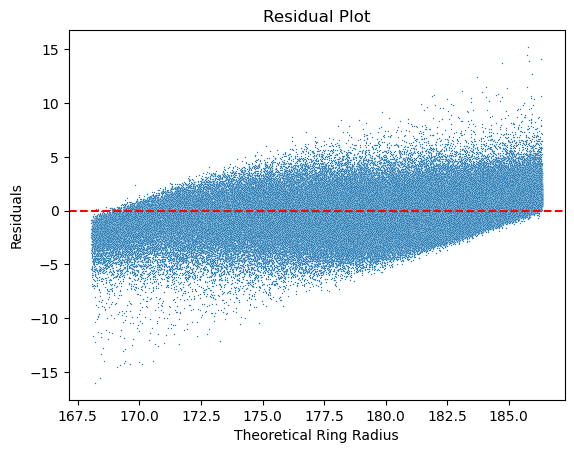

In [106]:
sns.scatterplot(data=pred_poly_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Theoretical Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

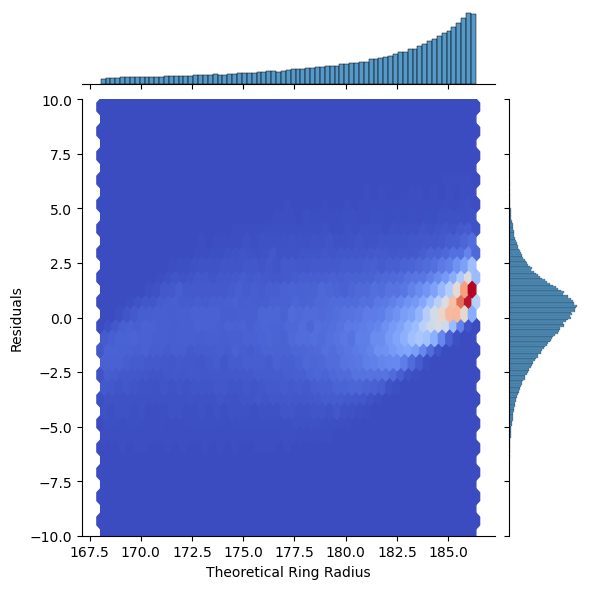

In [107]:
g = sns.jointplot(data=pred_poly_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Theoretical Ring Radius')
plt.ylabel('Residuals')

### 4.5 Testing the model on data subsetted on `median_hit_radius` only


#### 4.5.1 Subsetting the data 

In [108]:
X_train_red = X_train['median_hit_radius']
X_test_red = X_test['median_hit_radius']

#### 4.5.2 Fitting the model using the same optimized hyperparameters

In [109]:
xgb_opt.fit(X_train_red, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.5.3 Scoring on the train and test set

In [110]:
xgb_opt.score(X_train_red, y_train)

0.7722986140899024

In [111]:
xgb_opt.score(X_test_red, y_test)

0.7655727798058191

#### 4.5.4 Computing the residuals

In [112]:
ypred_red = xgb_opt.predict(X_test_red)

In [113]:
pred_red_df = pd.DataFrame(ypred_red, y_test).reset_index()
pred_red_df.columns=['theoretical_radius', 'predicted_radius']
pred_red_df['residual'] = pred_red_df['theoretical_radius'] - pred_red_df['predicted_radius']

Text(0, 0.5, 'Residuals')

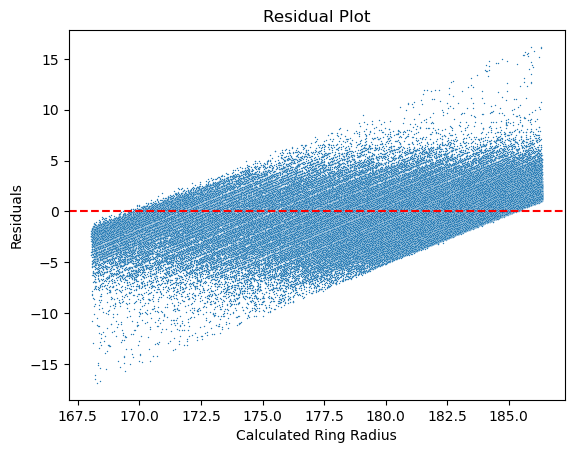

In [114]:
sns.scatterplot(data=pred_red_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

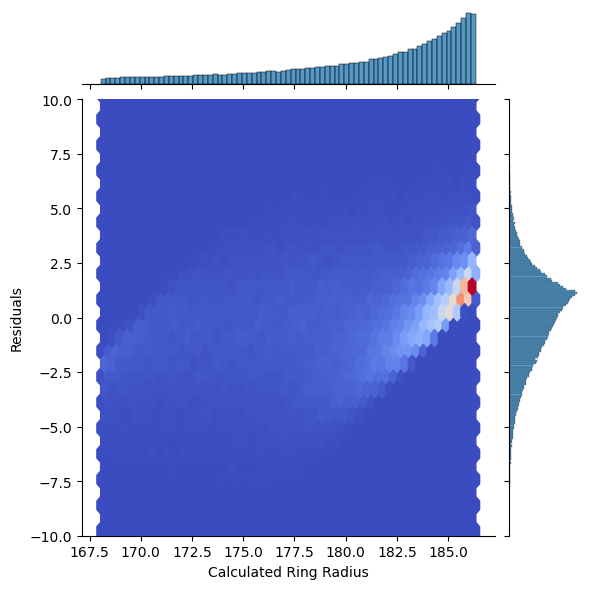

In [115]:
g = sns.jointplot(data=pred_red_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.6 Comparing the residual plot with ring radius calculated with SOTA 

#### 4.6.1 Data wrangling to include the SOTA radius into the dataset

In [116]:
sampled_data = pd.read_csv('../data/sampled_data.csv')

In [117]:
ring_radius_alg = sampled_data[['ring_radius']]

In [118]:
ring_radius_alg = grouped_hit_data.merge(ring_radius_alg, left_on='event', right_index=True)

#### 4.6.2 Computing the residuals

In [119]:
ring_radius_alg['residual'] = ring_radius_alg['ring_radius_cal'] - ring_radius_alg['ring_radius']

In [120]:
xgb_opt.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [121]:
ring_radius_alg['model_predicted_radius'] = xgb_opt.predict(ring_radius_alg.iloc[:, 1:20])

In [122]:
ring_radius_alg['residual_model'] = ring_radius_alg['ring_radius_cal'] - ring_radius_alg['model_predicted_radius']

#### Plotting residual from SOTA vs. residual from our model

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_25878/1968060652.py:8: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[0]._sizes = [100]
/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_25878/1968060652.py:9: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[1]._sizes = [100]


Text(0, 0.5, 'Residuals')

/Users/Jialing/opt/miniconda3/envs/591/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/Jialing/opt/miniconda3/envs/591/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


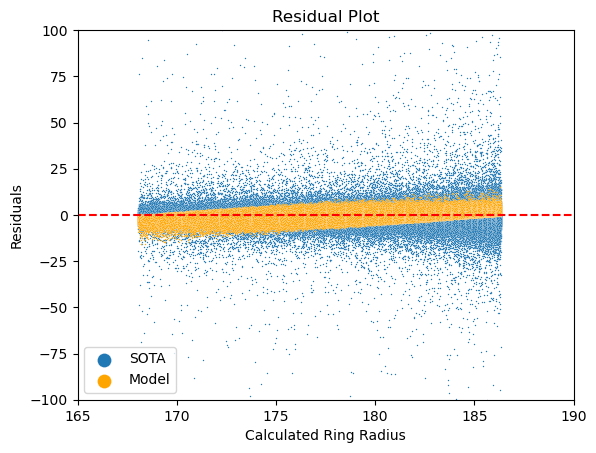

In [123]:
g = sns.scatterplot(data=ring_radius_alg, x='ring_radius_cal', y='residual', s=1, label='SOTA')
g = sns.scatterplot(data=ring_radius_alg, x='ring_radius_cal', y='residual_model', color = 'orange', s=1, label='Model')
plt.axhline(y=0, color='red', linestyle='--')
g.set(xlim = (165, 190))
g.set(ylim = (-100, 100))

legend = plt.legend()
legend.legendHandles[0]._sizes = [100]  
legend.legendHandles[1]._sizes = [100] 
plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.7 Plotting the `median_hit_radius` vs. calculated ring radius and momentum

#### 4.7.1 Plotting `median_hit_radius` vs. calculated ring radius

<Axes: xlabel='ring_radius_cal', ylabel='median_hit_radius'>

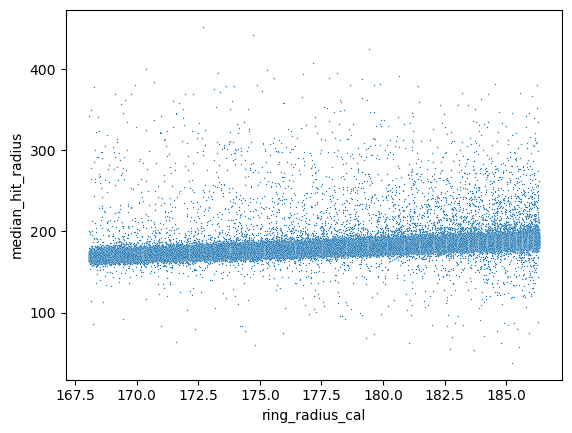

In [124]:
sns.scatterplot(data = grouped_hit_data, x = 'ring_radius_cal', y = 'median_hit_radius', s=1)

Text(33.097222222222214, 0.5, 'Median hit radius')

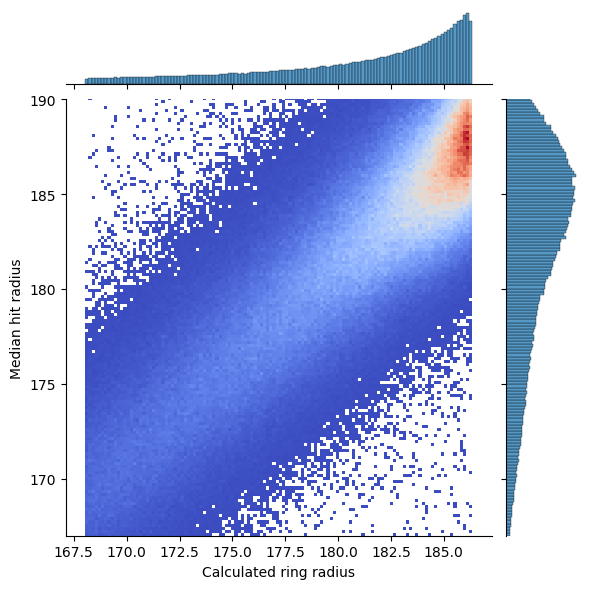

In [125]:
g = sns.jointplot(data = grouped_hit_data, x = 'ring_radius_cal', y = 'median_hit_radius', kind='hist', cmap='coolwarm', ylim=(167, 190))

plt.xlabel('Calculated ring radius')
plt.ylabel('Median hit radius')

#### 4.7.2 Plotting `median_hit_radius` vs. `track_momentum`
- The calculated (theoretical) ring radius is coloured in red 

<Axes: xlabel='track_momentum', ylabel='median_hit_radius'>

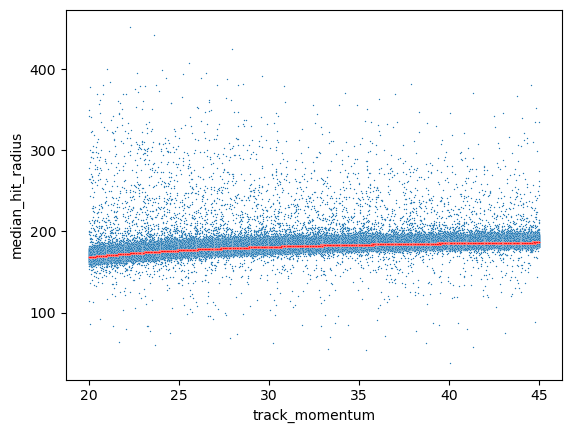

In [126]:
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'median_hit_radius', s=1)
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'ring_radius_cal', color = 'red', s=1)

#### 4.7.3 Plotting `median_hit_radius` vs. `track_momentum`
- The calculated (theoretical) ring radius is coloured in red

<Axes: xlabel='track_momentum', ylabel='median_hit_radius'>

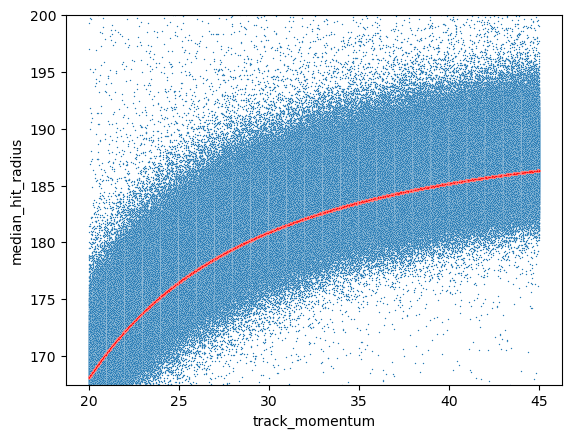

In [127]:
ploti = sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'median_hit_radius', s=1)
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'ring_radius_cal', color = 'red', s=1)
ploti.set(ylim = (167.5, 200))
ploti

### 4.8 Plotting the distribution of residuals in radius bins 

#### 4.8.1 Cutting the theoretical radius into 5 bins 

In [128]:
num_bins = 5
bin_edges = np.histogram_bin_edges(pred_df['theoretical_radius'], bins=num_bins)

In [129]:
pred_df['radius_bin'] = pd.cut(pred_df['theoretical_radius'], bins=bin_edges)

#### 4.8.2 Plotting the distribution of residuals 
- A density curve is used to show the distribution
- The 2.5% and 97.5% percentile bounds are labelled on each curve (covers 95% of the distribution)

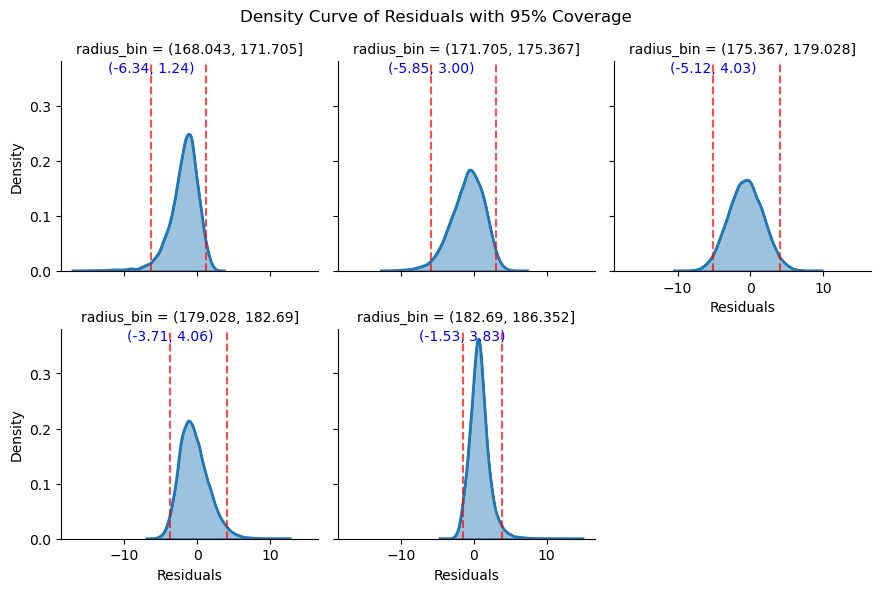

In [130]:
from scipy.stats import scoreatpercentile

g = sns.FacetGrid(pred_df, col='radius_bin', col_wrap=3)
g.map(sns.kdeplot, 'residual', fill=True)
g.map(sns.kdeplot, 'residual', lw=1)

def plot_density_curve(data, **kwargs):
    ax = plt.gca()
    p2_5 = scoreatpercentile(data, 2.5)
    p97_5 = scoreatpercentile(data, 97.5)
    
    sns.kdeplot(data, fill=True, ax=ax, **kwargs)
    sns.kdeplot(data, lw=2, ax=ax, **kwargs)
    ax.axvline(p2_5, color='red', linestyle='--', alpha=0.7, label='2.5% percentile')
    ax.axvline(p97_5, color='red', linestyle='--', alpha=0.7, label='97.5% percentile')
    ax.legend()
    ax.set_ylabel('Density')
    ax.text(p2_5, ax.get_ylim()[1], f'({p2_5:.2f}, {p97_5:.2f})', color='blue', va='top', ha='center')

g.map(plot_density_curve, 'residual')

g.set_axis_labels('Residuals', 'Density')

g.fig.suptitle('Density Curve of Residuals with 95% Coverage')

plt.tight_layout()

plt.show()

### 4.9 Sanity check with `RandomForestRegressor` 

#### 4.9.1 Fitting the model

In [131]:
from sklearn.ensemble import RandomForestRegressor

In [132]:
rf = RandomForestRegressor()

In [133]:
rf.fit(X_train, y_train)

RandomForestRegressor()

#### 4.9.2 Scoring on the test set

In [134]:
rf.score(X_train, y_train)

0.9745817349782092

In [135]:
rf.score(X_test, y_test)

0.817516947242006

#### 4.9.3 Computing the residuals 

In [136]:
ypred_rf = rf.predict(X_test)


In [137]:
pred_rf_df = pd.DataFrame(ypred_rf, y_test).reset_index()
pred_rf_df.columns=['theoretical_radius', 'predicted_radius']
pred_rf_df['residual'] = pred_rf_df['theoretical_radius'] - pred_rf_df['predicted_radius']

Text(0, 0.5, 'Residuals')

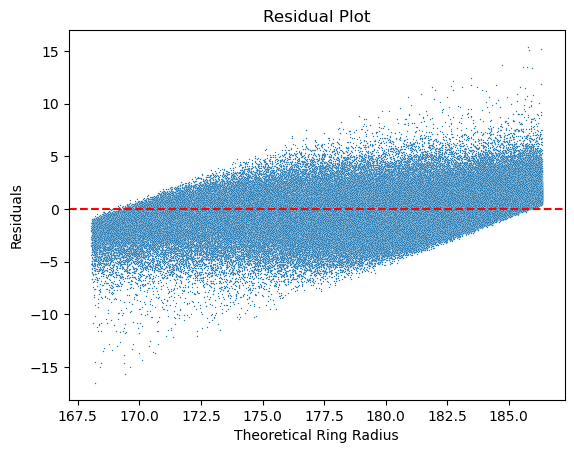

In [138]:
sns.scatterplot(data=pred_rf_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Theoretical Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

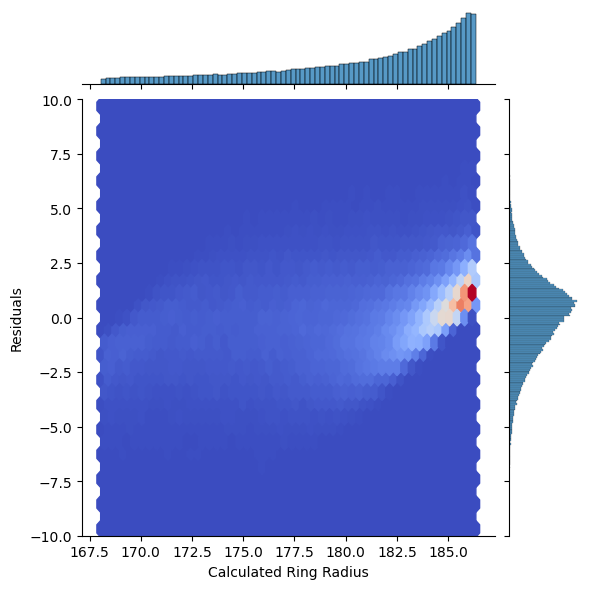

In [139]:
g = sns.jointplot(data=pred_rf_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

In [140]:
# rf_cv = cross_validate(rf, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [141]:
# pd.DataFrame(rf_cv)

### 4.10 `LightGBM`

#### 4.10.1 `LightGBM` with unscaled features 

In [142]:
from lightgbm.sklearn import LGBMRegressor

In [143]:
gbm = LGBMRegressor()

In [144]:
gbm.fit(X_train, y_train)

LGBMRegressor()

In [145]:
gbm_cv = cross_validate(gbm, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [146]:
pd.DataFrame(gbm_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,1.079933,0.193158,-2.041262,-2.022087,0.820090,0.824576
1,1.005698,0.148361,-2.030302,-2.026211,0.821714,0.823931
2,1.003121,0.135457,-2.033128,-2.023868,0.823507,0.823774
3,1.000750,0.136014,-2.042501,-2.023820,0.821694,0.823827
4,1.008717,0.138176,-2.048700,-2.017231,0.819808,0.825169


In [147]:
ypred_gbm = gbm.predict(X_test)


In [148]:
pred_gbm_df = pd.DataFrame(ypred_gbm, y_test).reset_index()
pred_gbm_df.columns=['theoretical_radius', 'predicted_radius']
pred_gbm_df['residual'] = pred_gbm_df['theoretical_radius'] - pred_gbm_df['predicted_radius']

Text(0, 0.5, 'Residuals')

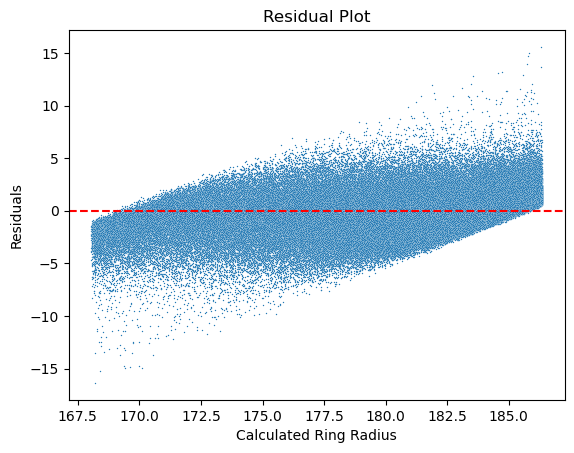

In [149]:
sns.scatterplot(data=pred_gbm_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

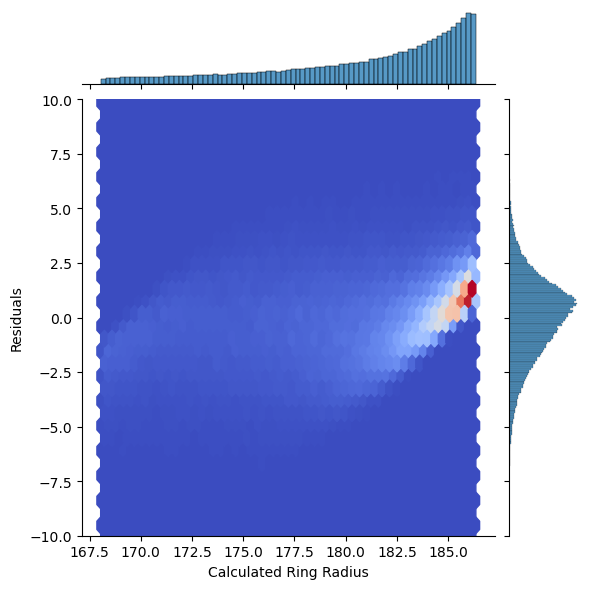

In [150]:
g = sns.jointplot(data=pred_gbm_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

#### 4.10.2 `LightGBM` with scaled features

In [151]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline

In [152]:
gbm_pipe = make_pipeline(StandardScaler(), LGBMRegressor())

In [153]:
gbm_pipe.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('lgbmregressor', LGBMRegressor())])

In [154]:
gbm_cv = cross_validate(gbm_pipe, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [155]:
pd.DataFrame(gbm_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,1.087110,0.220573,-2.038817,-2.019509,0.820520,0.825023
1,1.050622,0.146645,-2.027845,-2.023864,0.822145,0.824339
2,1.046137,0.135081,-2.032822,-2.023510,0.823560,0.823836
3,1.036515,0.136851,-2.040761,-2.021738,0.821997,0.824190
4,1.049707,0.135313,-2.050700,-2.018498,0.819456,0.824949


In [156]:
ypred_gbm_scaled = gbm_pipe.predict(X_test)


In [157]:
pred_gbm_scaled_df = pd.DataFrame(ypred_gbm_scaled, y_test).reset_index()
pred_gbm_scaled_df.columns=['theoretical_radius', 'predicted_radius']
pred_gbm_scaled_df['residual'] = pred_gbm_scaled_df['theoretical_radius'] - pred_gbm_scaled_df['predicted_radius']

Text(0, 0.5, 'Residuals')

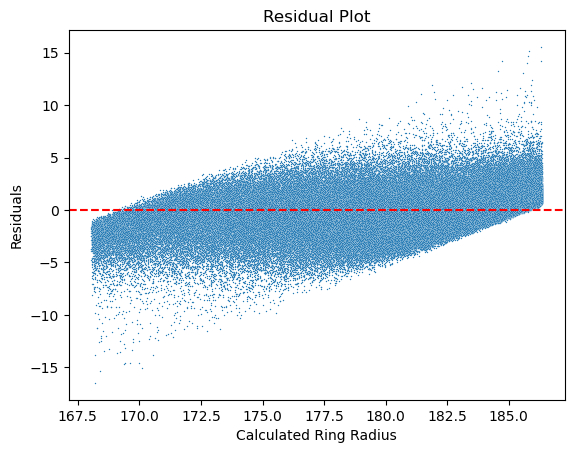

In [158]:
sns.scatterplot(data=pred_gbm_scaled_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

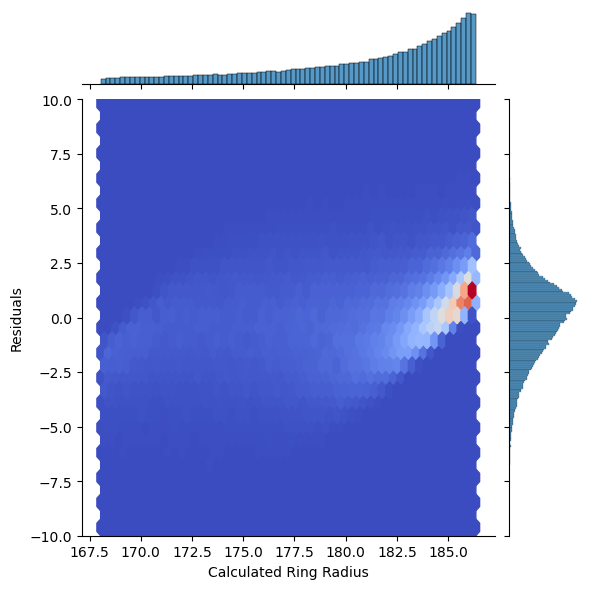

In [159]:
g = sns.jointplot(data=pred_gbm_scaled_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.11 `CatBoostRegressor`

In [160]:
from catboost import CatBoostRegressor

In [161]:
cbr = CatBoostRegressor(verbose=0)

In [162]:
cbr.fit(X_train, y_train)

In [163]:
cbr_cv = cross_validate(cbr, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [164]:
pd.DataFrame(cbr_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,11.334060,0.042987,-1.966575,-1.918333,0.833014,0.842116
1,11.174376,0.037644,-1.953814,-1.920498,0.834894,0.841824
2,11.184195,0.037480,-1.960927,-1.919971,0.835819,0.841403
3,11.317271,0.035799,-1.966180,-1.918095,0.834770,0.841753
4,11.787073,0.039780,-1.979370,-1.914430,0.831798,0.842534


In [165]:
ypred_cbr = cbr.predict(X_test)

In [166]:
pred_cbr_df = pd.DataFrame(ypred_cbr, y_test).reset_index()
pred_cbr_df.columns=['theoretical_radius', 'predicted_radius']
pred_cbr_df['residual'] = pred_cbr_df['theoretical_radius'] - pred_cbr_df['predicted_radius']

Text(0, 0.5, 'Residuals')

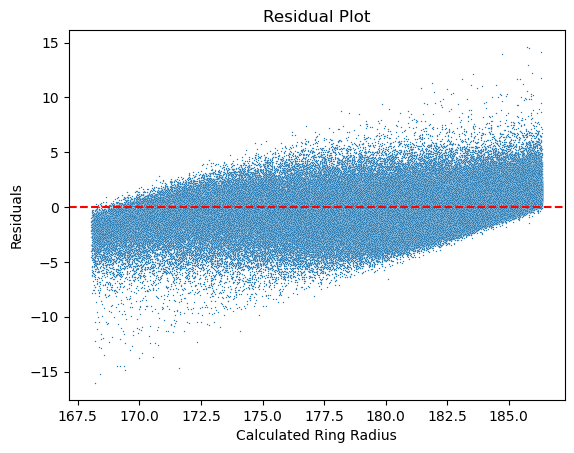

In [167]:
sns.scatterplot(data=pred_cbr_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

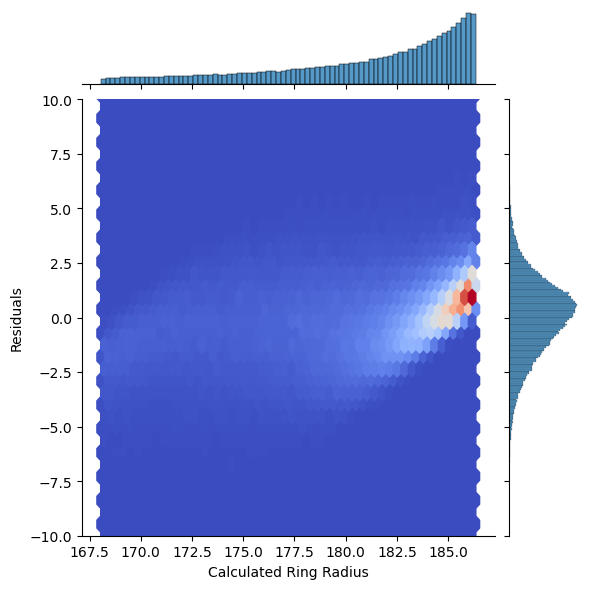

In [168]:
g = sns.jointplot(data=pred_cbr_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.12 Correlation heatmap between features 

In [169]:
corr_df = grouped_hit_data.drop(columns=['event', 'track_momentum', 'ring_radius_cal', 'momentum_bin', 'radius_bin'])

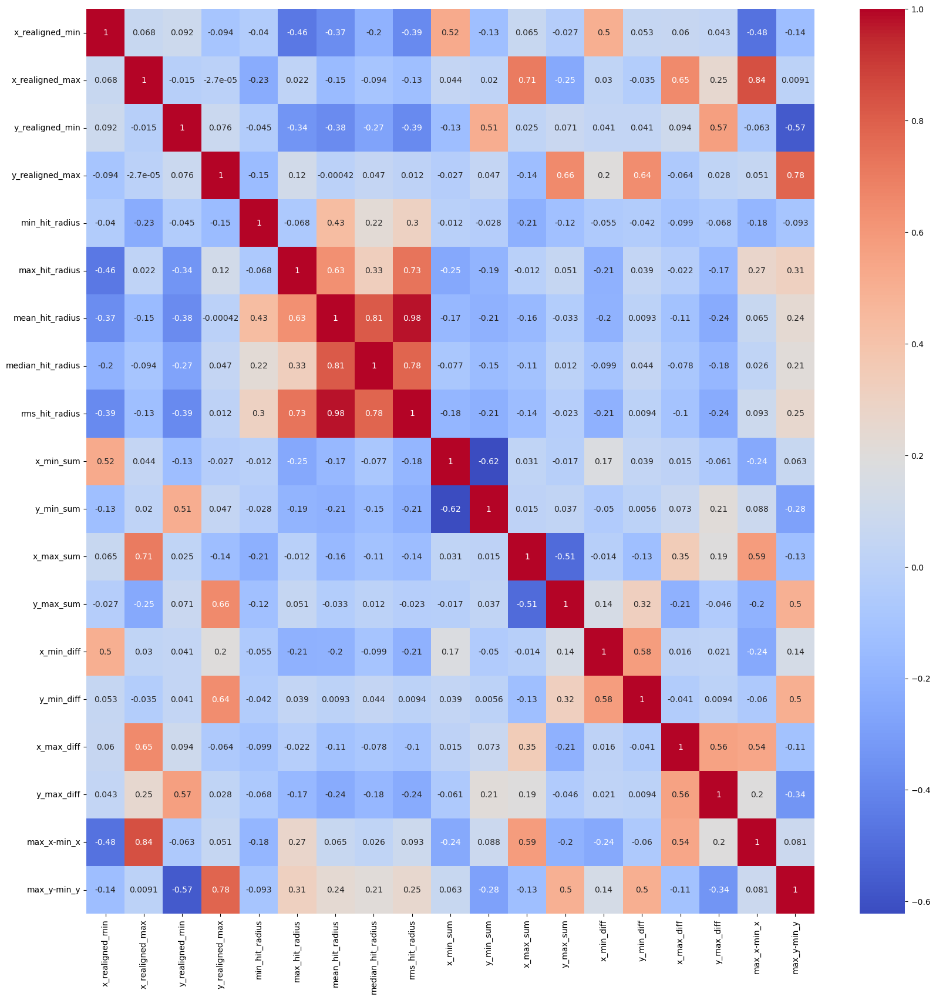

In [170]:
correlation_matrix = corr_df.corr()

plt.figure(figsize=(20, 20)) 

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.show()

### 4.13 Summary 
- 4.1 Performance of `XGBRegressor` with default hyperparameters 

    - `XGBRegressor` with default hyperparameters exhibited a train score of 0.84 and test score of 0.83 
    
- 4.2 Hyperparameter optimization on `XGBRegressor`

    - The best parameters found by `RandomizedSearch` are 'reg_lambda': 0.5, 'reg_alpha': 0.5,'n_estimators': 500, 'max_depth': 6,'learning_rate': 0.1

- 4.3 Performance of optimized `XGBRegressor` with `Dart` booster 

    - The `XGBRegressor` with `Dart` booster exhibited a train score of 0.85 and test score of 0.84

- 4.4 Performance of optimized `XGBRegressor` with features transformed by `PolynomialFeatures` 

    - The `XGBRegressor` with features transformed to a degree of 2 exhibited a train score of 0.86 and test score of 0.84 

- 4.5 Performance of optimized `XGBRegressor` with `median_hit_radius` only

    - The `XGBRegressor` with `median_hit_radius` only exhibited a train score of 0.77 and test score of 0.77

- 4.6 Comparison of the residuals between the optimized `XGBRegressor` and SOTA

    - From the overlaid residual plots, it can be seen that the optimized `XGBRegressor` shows a thinner distribution in the residuals

- 4.7 Plots showing relationship between `track_momentum` and calculated ring radius vs. `median_hit_radius`

    - More points are concentrated above the line indicating the calculated ring radius (in red)

- 4.8 Plots of residual ditribution from `XGBRegressor` in 5 radius bins 

    - It can be seen that the mean of the residuals shifts to the left as the radius increases, and the distribution becomes narrower 

- 4.9 Performance comparison with `RandomForestRegressor`

    - `RandomForestRegressor` with default hyperparameters exhibited a train score of 0.97 and a test score of 0.82

- 4.10 Performance comparison with `LightGBM`

    - `LightGBM` with default hyperparameters exhibited a train score of 0.82 and test score of 0.82

- 4.11 Performance comparison with `CatBoostRegressor` 

    - `CatBoostRegressor` with default hyperparameters exhibited a train score of 0.84 and test score of 0.83